In [2]:
######################################################################################################

# ACCIDENT DATASET PROJECT - OKWUCHI ANYANWU - 202250228

## Install Some Libraries

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Mount Drive For Google Colab

In [7]:
# from google.colab import drive
# drive.mount('/content/drive')

# IMPORT USEFUL LIBRARIES

In [8]:
# Generial libraris
import sqlite3
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
# from ydata_profiling import ProfileReport
import sweetviz as sv
import warnings
warnings.filterwarnings("ignore")
warnings.filterwarnings('ignore', category=DeprecationWarning)

# Importing libraries for appriori analysis
from imblearn.under_sampling import RandomUnderSampler
from sklearn.feature_selection import SelectKBest, f_classif
from mlxtend.frequent_patterns import association_rules
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori

#Clustering
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn_extra.cluster import KMedoids
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score

# Outlier Detection
from sklearn.neighbors import LocalOutlierFactor
from sklearn.ensemble import IsolationForest

# For ploting live map
import folium

# Modeling (Classification)
from numpy import mean, std
from sklearn.model_selection import cross_val_score, RepeatedStratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.ensemble import StackingClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.metrics import balanced_accuracy_score

/usr/local/lib/python3.10/dist-packages/sklearn_extra/cluster/_commonnn.py:18: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(sklearn.__version__) < LooseVersion("0.23.0"):
/usr/local/lib/python3.10/dist-packages/sklearn_extra/cluster/_commonnn.py:18: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(sklearn.__version__) < LooseVersion("0.23.0"):


In [9]:
warnings.filterwarnings("ignore")
warnings.filterwarnings('ignore', category=DeprecationWarning)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# LOADING AND CONNECTING TO THE ACCIDENT DATABASE

### Using Google Colab

In [10]:
# # loading the accident dataset
con = sqlite3.connect('/content/drive/MyDrive/SECOND TRIMESTER/BIG DATA/SUMMATIVE/Big Data Presentation/accident_data_v1.0.0_2023.db')
cur = con.cursor()

### Using Jupyter Notebook

In [11]:
# con = sqlite3.connect("G:/SECOND TRIMESTER/BIG DATA/CLASS 3 WORKSHOP 3/accident_data_v1.0.0_2023.db")
# cur = con.cursor()

### FETCHING ALL THE TABLES IN THE ACCIDENT DATASET

In [12]:
tables = cur.execute("SELECT name FROM sqlite_master WHERE type='table'")
tables.fetchall()

[('accident',), ('casualty',), ('vehicle',), ('lsoa',)]

# Data Exploration and Data Cleaning of Each Table in the Accident Data Base

# Acciddent Table (Exploration and Primary Cleaning)

In [13]:
# getting the columns from the accident table

accident_table = cur.execute(f"PRAGMA table_info(accident)").fetchall()
accident_table

[(0, 'accident_index', '', 0, None, 1),
 (1, 'accident_year', '', 0, None, 0),
 (2, 'accident_reference', '', 0, None, 0),
 (3, 'location_easting_osgr', '', 0, None, 0),
 (4, 'location_northing_osgr', '', 0, None, 0),
 (5, 'longitude', '', 0, None, 0),
 (6, 'latitude', '', 0, None, 0),
 (7, 'police_force', '', 0, None, 0),
 (8, 'accident_severity', '', 0, None, 0),
 (9, 'number_of_vehicles', '', 0, None, 0),
 (10, 'number_of_casualties', '', 0, None, 0),
 (11, 'date', '', 0, None, 0),
 (12, 'day_of_week', '', 0, None, 0),
 (13, 'time', '', 0, None, 0),
 (14, 'local_authority_district', '', 0, None, 0),
 (15, 'local_authority_ons_district', '', 0, None, 0),
 (16, 'local_authority_highway', '', 0, None, 0),
 (17, 'first_road_class', '', 0, None, 0),
 (18, 'first_road_number', '', 0, None, 0),
 (19, 'road_type', '', 0, None, 0),
 (20, 'speed_limit', '', 0, None, 0),
 (21, 'junction_detail', '', 0, None, 0),
 (22, 'junction_control', '', 0, None, 0),
 (23, 'second_road_class', '', 0, None,

### Putting it in a Data Frame

In [14]:
acc_df_raw = pd.read_sql_query("""SELECT * FROM accident WHERE accident_year = 2020""", con)
acc_df_raw

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,1,3,1,...,9,1,9,9,0,0,1,3,2,E01004576
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,4,1,1,1,0,0,1,1,2,E01003034
2,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,1,3,1,...,0,4,1,2,0,0,1,1,2,E01004726
3,2020010228006,2020,010228006,538676.0,184371.0,-0.001683,51.541210,1,2,1,...,4,4,1,1,0,0,1,1,2,E01003617
4,2020010228011,2020,010228011,529324.0,181286.0,-0.137592,51.515704,1,3,1,...,0,4,1,1,0,0,1,1,2,E01004763
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91194,2020991027064,2020,991027064,343034.0,731654.0,-2.926320,56.473539,99,2,2,...,0,1,1,1,0,0,1,1,-1,-1
91195,2020991029573,2020,991029573,257963.0,658891.0,-4.267565,55.802353,99,3,1,...,0,1,1,1,0,0,1,2,-1,-1
91196,2020991030297,2020,991030297,383664.0,810646.0,-2.271903,57.186317,99,2,2,...,0,1,1,1,0,0,2,1,-1,-1
91197,2020991030900,2020,991030900,277161.0,674852.0,-3.968753,55.950940,99,3,2,...,0,1,1,1,0,0,1,2,-1,-1


In [15]:
acc_df_raw.info() # checking for information in the data set

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91199 entries, 0 to 91198
Data columns (total 36 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   accident_index                               91199 non-null  object 
 1   accident_year                                91199 non-null  int64  
 2   accident_reference                           91199 non-null  object 
 3   location_easting_osgr                        91185 non-null  float64
 4   location_northing_osgr                       91185 non-null  float64
 5   longitude                                    91185 non-null  float64
 6   latitude                                     91185 non-null  float64
 7   police_force                                 91199 non-null  int64  
 8   accident_severity                            91199 non-null  int64  
 9   number_of_vehicles                           91199 non-null  int64  
 10

## Visualising the Accident data using Sweetviz

                                             |          | [  0%]   00:00 -> (? left)


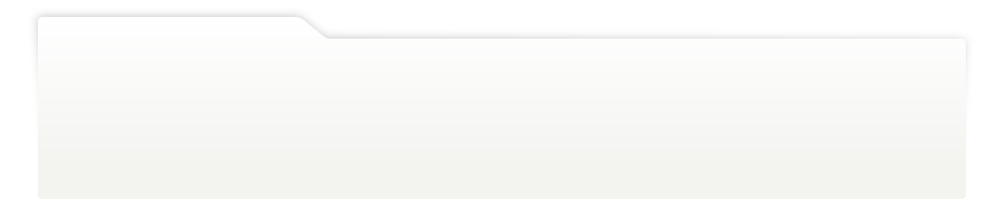
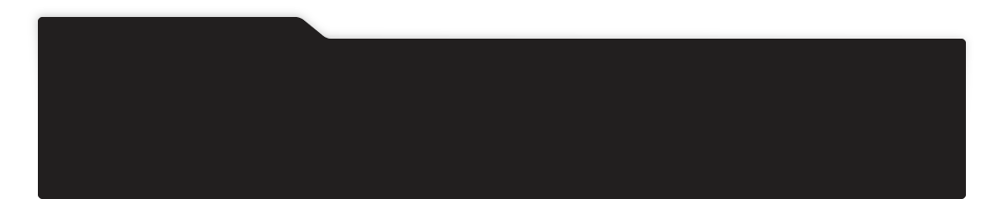
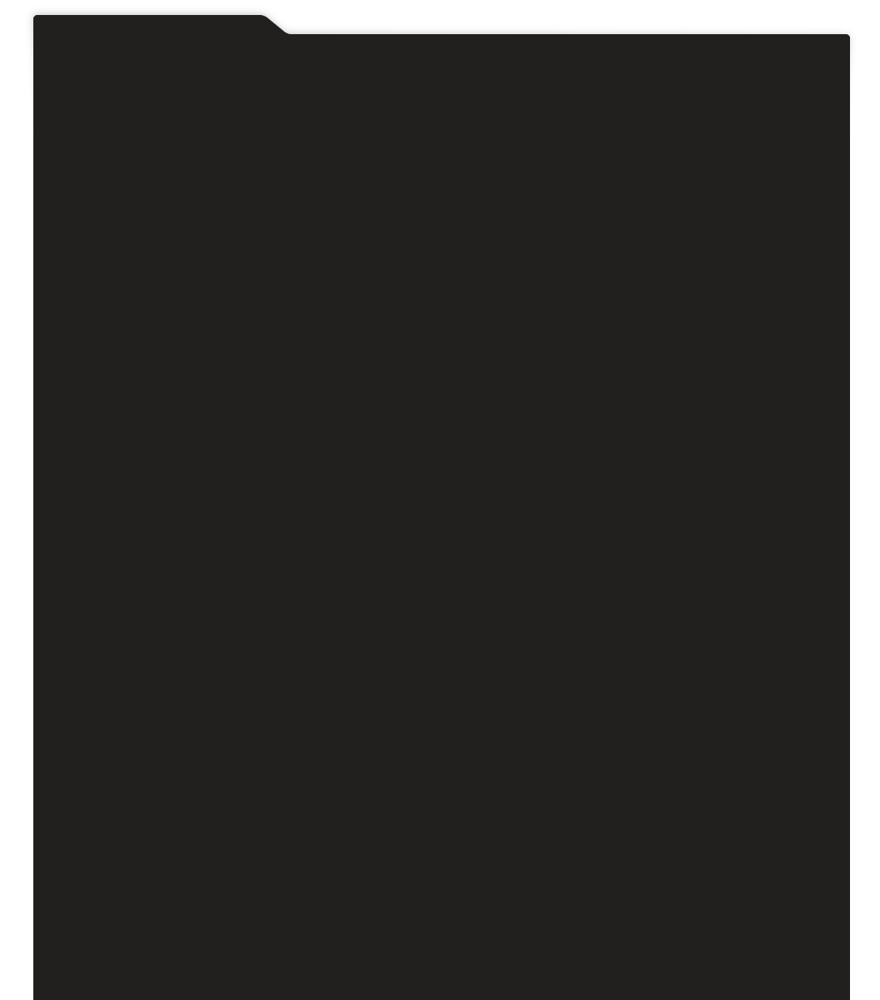
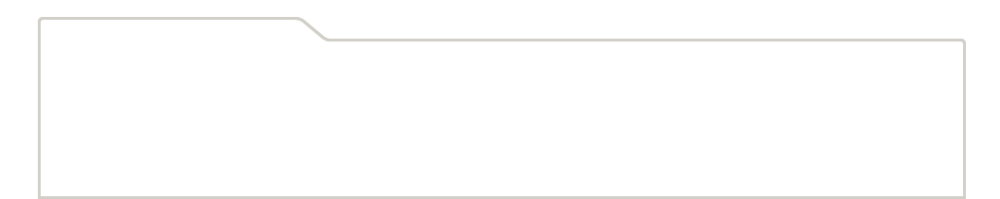
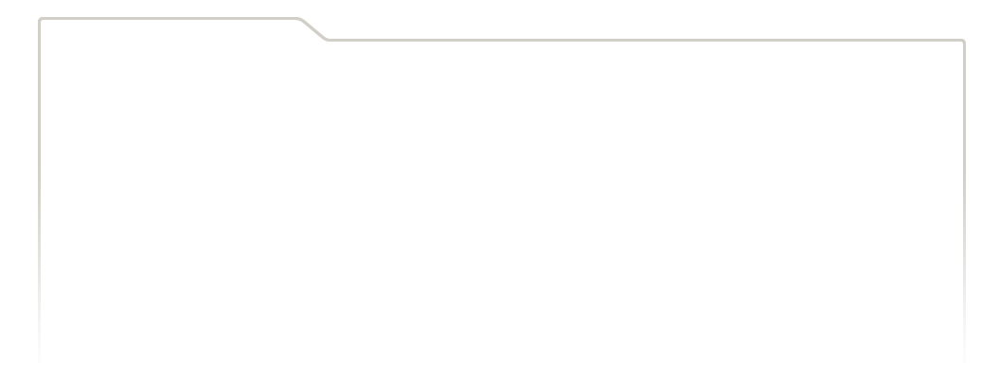
...
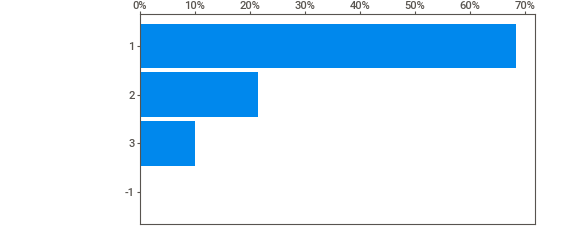
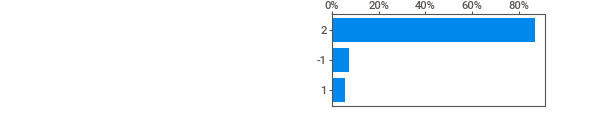
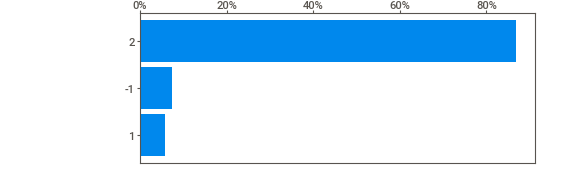
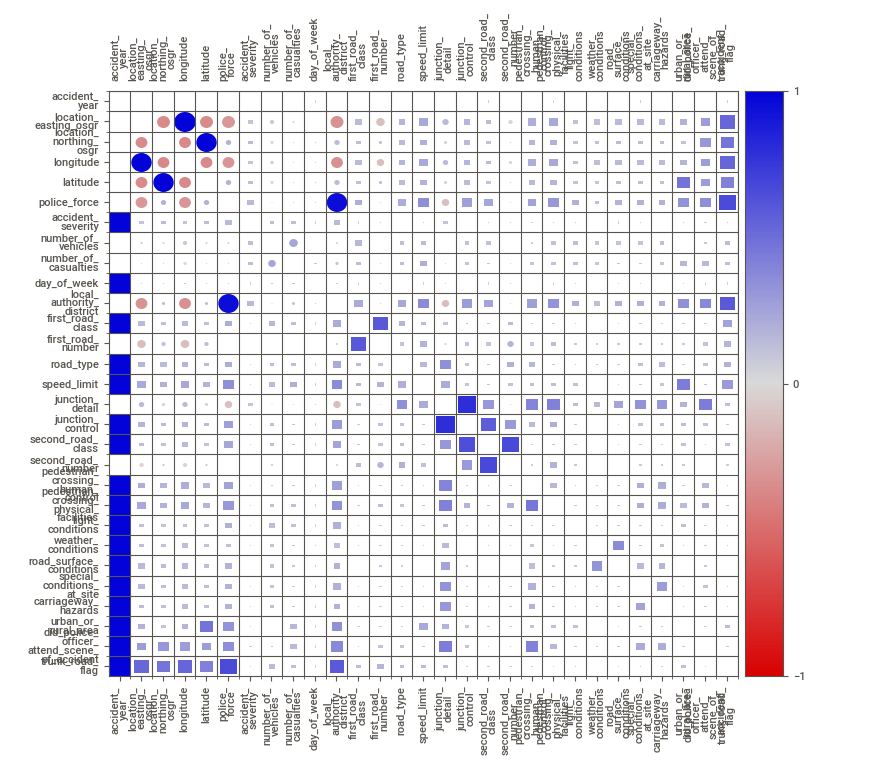
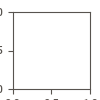

In [16]:
acc_df_profile = sv.analyze(acc_df_raw)



acc_df_profile.show_notebook()

### cheching the exact rows with NaN values and Incorrect entries

In [17]:
acc_df_raw.isna().sum()

accident_index                                  0
accident_year                                   0
accident_reference                              0
location_easting_osgr                          14
location_northing_osgr                         14
longitude                                      14
latitude                                       14
police_force                                    0
accident_severity                               0
number_of_vehicles                              0
number_of_casualties                            0
date                                            0
day_of_week                                     0
time                                            0
local_authority_district                        0
local_authority_ons_district                    0
local_authority_highway                         0
first_road_class                                0
first_road_number                               0
road_type                                       0


In [18]:
(acc_df_raw[acc_df_raw.isnull().any(axis=1)])

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location
25520,2020052002442,2020,052002442,NaN,NaN,NaN,NaN,5,2,2,...,0,1,1,1,0,0,3,1,2,-1
29452,2020070769852,2020,070769852,NaN,NaN,NaN,NaN,7,3,2,...,0,1,1,1,0,0,3,1,2,-1
32689,2020122001194,2020,122001194,NaN,NaN,NaN,NaN,12,3,2,...,0,1,2,2,0,0,3,1,2,-1
33578,2020137330369,2020,137330369,NaN,NaN,NaN,NaN,13,3,2,...,0,1,1,1,0,0,3,1,1,-1
81252,2020522005114,2020,522005114,NaN,NaN,NaN,NaN,52,3,3,...,0,7,1,1,0,0,3,1,2,-1
86437,2020622001016,2020,622001016,NaN,NaN,NaN,NaN,62,3,2,...,5,4,1,1,0,0,3,1,-1,-1
86642,202063A017520,2020,63A017520,NaN,NaN,NaN,NaN,63,3,2,...,0,1,9,-1,0,0,3,2,-1,-1
86651,202063A018920,2020,63A018920,NaN,NaN,NaN,NaN,63,3,2,...,0,1,9,1,0,0,3,2,-1,-1
86668,202063A025020,2020,63A025020,NaN,NaN,NaN,NaN,63,3,2,...,0,1,2,2,0,0,3,2,-1,-1
86705,202063A035620,2020,63A035620,NaN,NaN,NaN,NaN,63,3,1,...,0,1,1,1,0,0,3,2,-1,-1


In [19]:
acc_df_raw.isin([-1, '-1', ' ']).sum() # cehcking for special entreies

accident_index                                     0
accident_year                                      0
accident_reference                                 0
location_easting_osgr                              0
location_northing_osgr                             0
longitude                                          0
latitude                                           0
police_force                                       0
accident_severity                                  0
number_of_vehicles                                 0
number_of_casualties                               0
date                                               0
day_of_week                                        0
time                                               0
local_authority_district                         991
local_authority_ons_district                       0
local_authority_highway                            0
first_road_class                                   0
first_road_number                             

## keep original copy of Accident Data before cleaning

In [20]:
acc_df = acc_df_raw.copy()

## Define a Function to Clean the NaN values. with Mode for Categorical variables and Median for Continous vairbales

In [21]:
def sub_nan_columns(data):
    for col in data.columns:
        if 'age' in col:
            median_value = data[col].median()  # Compute the median
            data[col].fillna(median_value, inplace=True)  # Replace NaN values with median
        else:
            mode_value = data[col].mode()[0]  # Compute the mode
            data[col].fillna(mode_value, inplace=True)  # Replace NaN values with mode

In [22]:
sub_nan_columns(acc_df)

In [23]:
acc_df.isna().sum() # Code validation

accident_index                                 0
accident_year                                  0
accident_reference                             0
location_easting_osgr                          0
location_northing_osgr                         0
longitude                                      0
latitude                                       0
police_force                                   0
accident_severity                              0
number_of_vehicles                             0
number_of_casualties                           0
date                                           0
day_of_week                                    0
time                                           0
local_authority_district                       0
local_authority_ons_district                   0
local_authority_highway                        0
first_road_class                               0
first_road_number                              0
road_type                                      0
speed_limit         

# Vahicle Table (Exploration and Primary Cleaning)

In [24]:
vehicle_table = cur.execute(f"PRAGMA table_info(vehicle)").fetchall()
vehicle_table

[(0, 'vehicle_index', '', 0, None, 1),
 (1, 'accident_index', '', 0, None, 0),
 (2, 'accident_year', '', 0, None, 0),
 (3, 'accident_reference', '', 0, None, 0),
 (4, 'vehicle_reference', '', 0, None, 0),
 (5, 'vehicle_type', '', 0, None, 0),
 (6, 'towing_and_articulation', '', 0, None, 0),
 (7, 'vehicle_manoeuvre', '', 0, None, 0),
 (8, 'vehicle_direction_from', '', 0, None, 0),
 (9, 'vehicle_direction_to', '', 0, None, 0),
 (10, 'vehicle_location_restricted_lane', '', 0, None, 0),
 (11, 'junction_location', '', 0, None, 0),
 (12, 'skidding_and_overturning', '', 0, None, 0),
 (13, 'hit_object_in_carriageway', '', 0, None, 0),
 (14, 'vehicle_leaving_carriageway', '', 0, None, 0),
 (15, 'hit_object_off_carriageway', '', 0, None, 0),
 (16, 'first_point_of_impact', '', 0, None, 0),
 (17, 'vehicle_left_hand_drive', '', 0, None, 0),
 (18, 'journey_purpose_of_driver', '', 0, None, 0),
 (19, 'sex_of_driver', '', 0, None, 0),
 (20, 'age_of_driver', '', 0, None, 0),
 (21, 'age_band_of_driver', 

### Puting it in Data frame

In [25]:
veh_df_raw = pd.read_sql_query("""SELECT * FROM vehicle WHERE accident_year = 2020""", con)
veh_df_raw

,vehicle_index,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,...,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,681716,2020010219808,2020,010219808,1,9,9,5,1,5,...,6,2,32,6,1968,2,6,AUDI Q5,4,1
1,681717,2020010220496,2020,010220496,1,9,0,4,2,6,...,2,1,45,7,1395,1,2,AUDI A1,7,1
2,681718,2020010228005,2020,010228005,1,9,0,18,-1,-1,...,6,3,-1,-1,-1,-1,-1,-1,-1,-1
3,681719,2020010228006,2020,010228006,1,8,0,18,1,5,...,1,1,44,7,1798,8,8,TOYOTA PRIUS,2,1
4,681720,2020010228011,2020,010228011,1,9,0,18,3,7,...,6,1,20,4,2993,2,4,BMW 4 SERIES,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167370,849086,2020991030297,2020,991030297,1,9,0,7,8,2,...,1,1,57,9,1968,2,2,AUDI A5,7,1
167371,849087,2020991030297,2020,991030297,2,5,0,16,6,2,...,5,1,38,7,1301,1,2,KTM 1290 SUPERDUKE,9,2
167372,849088,2020991030900,2020,991030900,1,9,0,7,8,2,...,6,2,68,10,1995,2,1,BMW X3,5,1
167373,849089,2020991030900,2020,991030900,2,1,0,18,6,2,...,6,1,76,11,-1,-1,-1,-1,9,1


In [26]:
veh_df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 167375 entries, 0 to 167374
Data columns (total 28 columns):
 #   Column                            Non-Null Count   Dtype 
---  ------                            --------------   ----- 
 0   vehicle_index                     167375 non-null  int64 
 1   accident_index                    167375 non-null  object
 2   accident_year                     167375 non-null  int64 
 3   accident_reference                167375 non-null  object
 4   vehicle_reference                 167375 non-null  int64 
 5   vehicle_type                      167375 non-null  int64 
 6   towing_and_articulation           167375 non-null  int64 
 7   vehicle_manoeuvre                 167375 non-null  int64 
 8   vehicle_direction_from            167375 non-null  int64 
 9   vehicle_direction_to              167375 non-null  int64 
 10  vehicle_location_restricted_lane  167375 non-null  int64 
 11  junction_location                 167375 non-null  int64 
 12  sk

## Exploring the Vehicle Dataset (Table)

                                             |          | [  0%]   00:00 -> (? left)


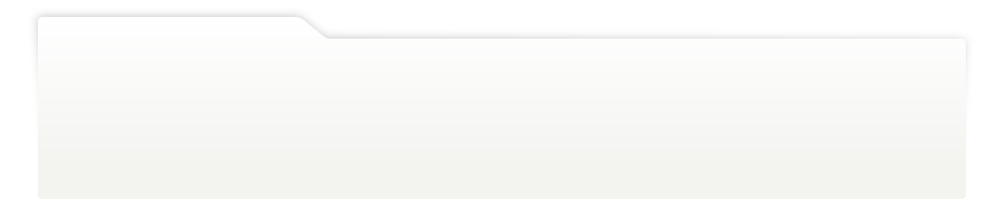
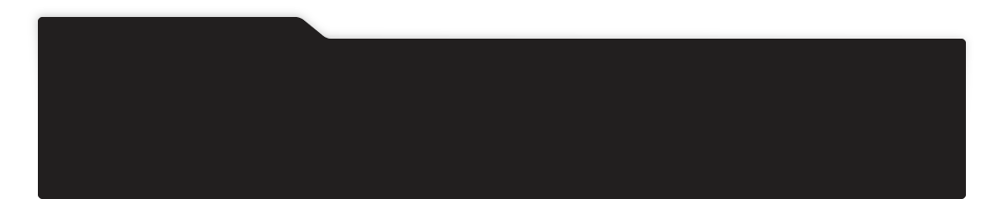
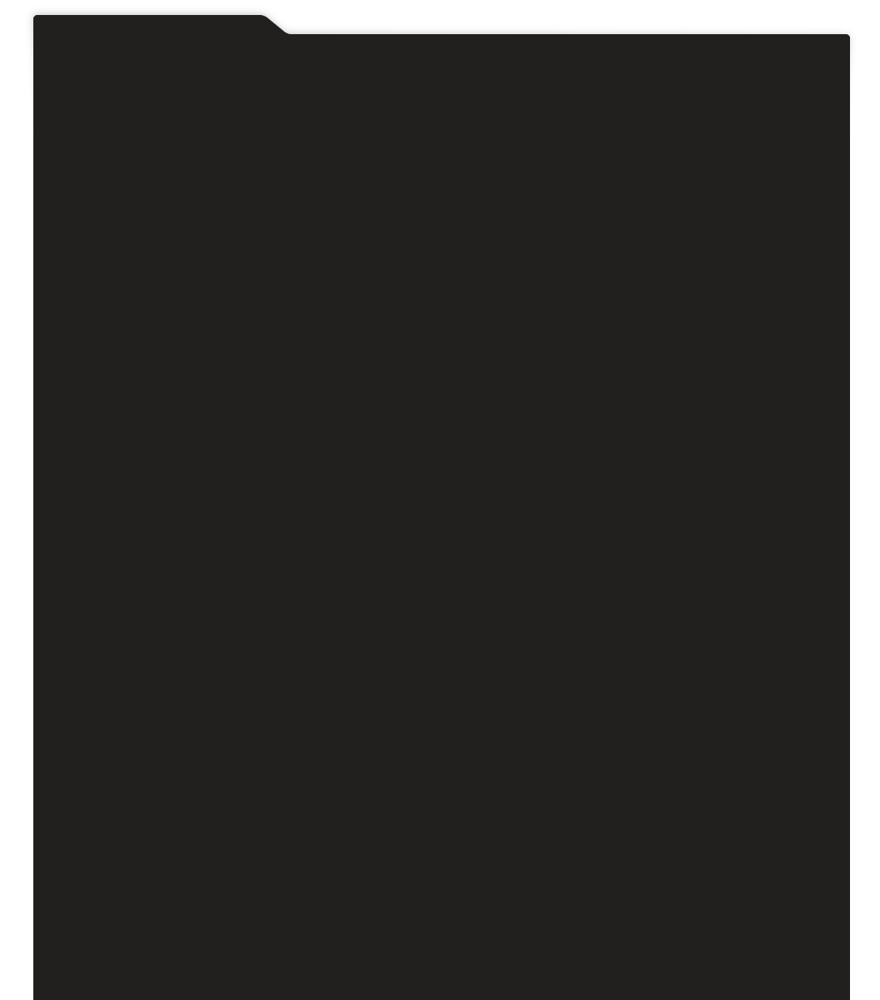
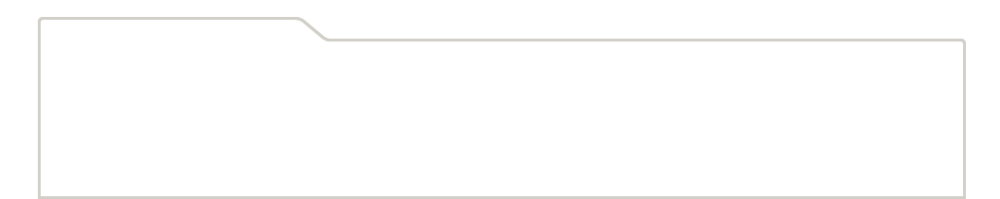
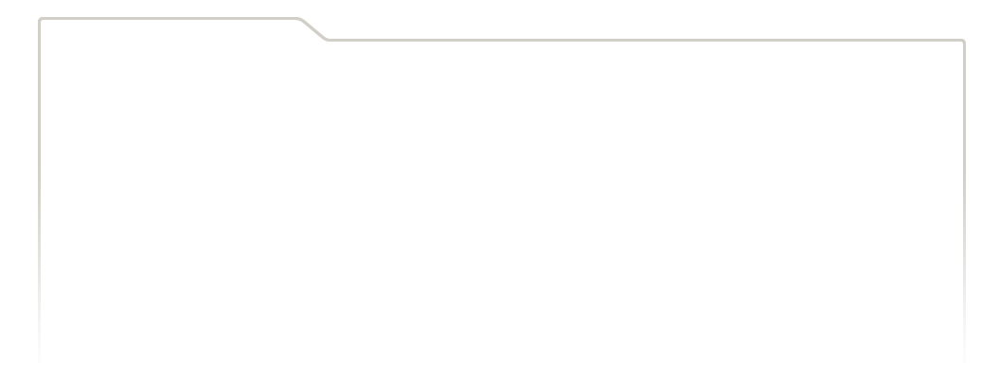
...
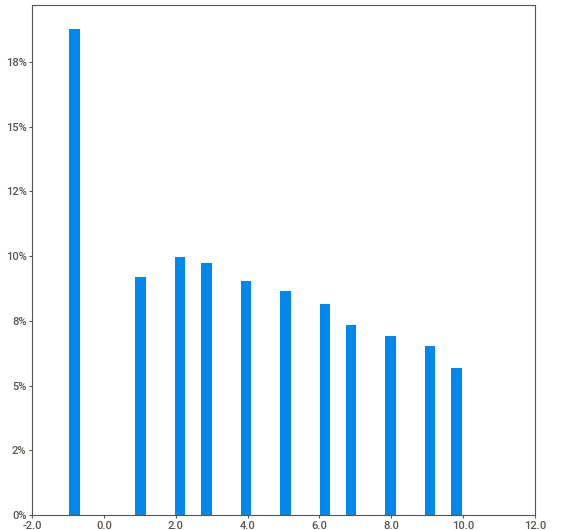
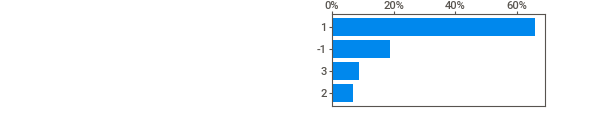
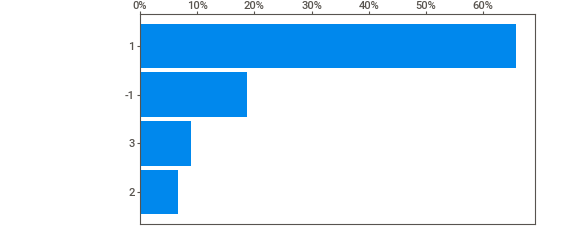
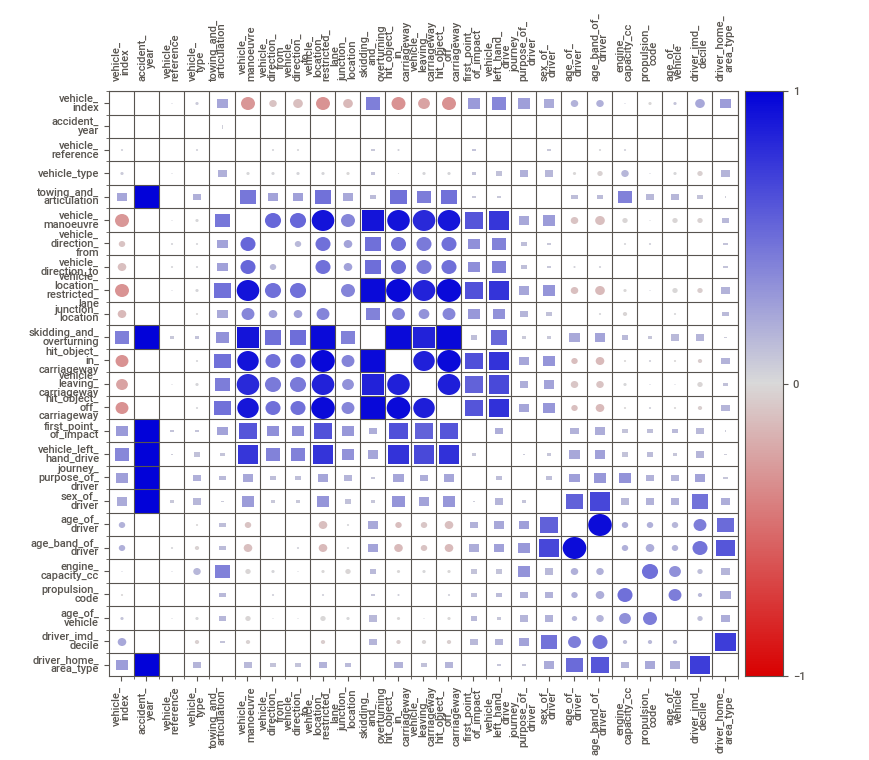
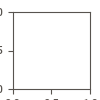

In [27]:
veh_df_profile = sv.analyze(veh_df_raw)



veh_df_profile.show_notebook()

### Checking for NaN

In [28]:
veh_df_raw.isna().sum()   # checking for null values in the vehicle table
                      # NO missing vaules in the vehicle df

vehicle_index                       0
accident_index                      0
accident_year                       0
accident_reference                  0
vehicle_reference                   0
vehicle_type                        0
towing_and_articulation             0
vehicle_manoeuvre                   0
vehicle_direction_from              0
vehicle_direction_to                0
vehicle_location_restricted_lane    0
junction_location                   0
skidding_and_overturning            0
hit_object_in_carriageway           0
vehicle_leaving_carriageway         0
hit_object_off_carriageway          0
first_point_of_impact               0
vehicle_left_hand_drive             0
journey_purpose_of_driver           0
sex_of_driver                       0
age_of_driver                       0
age_band_of_driver                  0
engine_capacity_cc                  0
propulsion_code                     0
age_of_vehicle                      0
generic_make_model                  0
driver_imd_d

In [29]:
# Check for columns containing -1
cols_with_minus1 = veh_df_raw.columns[veh_df_raw.eq(-1).any()]
print("\nColumns containing -1:")
print(cols_with_minus1)


Columns containing -1:
Index(['towing_and_articulation', 'vehicle_manoeuvre',
       'vehicle_direction_from', 'vehicle_direction_to',
       'vehicle_location_restricted_lane', 'junction_location',
       'skidding_and_overturning', 'hit_object_in_carriageway',
       'vehicle_leaving_carriageway', 'hit_object_off_carriageway',
       'first_point_of_impact', 'vehicle_left_hand_drive',
       'journey_purpose_of_driver', 'sex_of_driver', 'age_of_driver',
       'age_band_of_driver', 'engine_capacity_cc', 'propulsion_code',
       'age_of_vehicle', 'driver_imd_decile', 'driver_home_area_type'],
      dtype='object')


In [30]:
veh_df_raw.isin([-1, '-1', ' ']).sum()

vehicle_index                           0
accident_index                          0
accident_year                           0
accident_reference                      0
vehicle_reference                       0
vehicle_type                            0
towing_and_articulation               689
vehicle_manoeuvre                     679
vehicle_direction_from               1640
vehicle_direction_to                 1653
vehicle_location_restricted_lane      640
junction_location                     284
skidding_and_overturning              662
hit_object_in_carriageway             636
vehicle_leaving_carriageway           644
hit_object_off_carriageway              4
first_point_of_impact                 939
vehicle_left_hand_drive               877
journey_purpose_of_driver             184
sex_of_driver                          13
age_of_driver                       23344
age_band_of_driver                  23344
engine_capacity_cc                  43603
propulsion_code                   

## Make a Copy of the Orifinal Vehicle Data

In [31]:
veh_df = veh_df_raw.copy()

## Passing the function to clean the casualty vehciel DF

In [32]:
sub_nan_columns(veh_df)

In [33]:
veh_df.isin([-1, '-1', ' ']).sum() # code validation   # Those columns with not cleaned would not be considered for this analysis

vehicle_index                           0
accident_index                          0
accident_year                           0
accident_reference                      0
vehicle_reference                       0
vehicle_type                            0
towing_and_articulation               689
vehicle_manoeuvre                     679
vehicle_direction_from               1640
vehicle_direction_to                 1653
vehicle_location_restricted_lane      640
junction_location                     284
skidding_and_overturning              662
hit_object_in_carriageway             636
vehicle_leaving_carriageway           644
hit_object_off_carriageway              4
first_point_of_impact                 939
vehicle_left_hand_drive               877
journey_purpose_of_driver             184
sex_of_driver                          13
age_of_driver                       23344
age_band_of_driver                  23344
engine_capacity_cc                  43603
propulsion_code                   

# Casualty Table (Exploration and Primary Cleaning)

In [34]:
casualty_table = cur.execute(f"PRAGMA table_info(vehicle)").fetchall()
casualty_table

[(0, 'vehicle_index', '', 0, None, 1),
 (1, 'accident_index', '', 0, None, 0),
 (2, 'accident_year', '', 0, None, 0),
 (3, 'accident_reference', '', 0, None, 0),
 (4, 'vehicle_reference', '', 0, None, 0),
 (5, 'vehicle_type', '', 0, None, 0),
 (6, 'towing_and_articulation', '', 0, None, 0),
 (7, 'vehicle_manoeuvre', '', 0, None, 0),
 (8, 'vehicle_direction_from', '', 0, None, 0),
 (9, 'vehicle_direction_to', '', 0, None, 0),
 (10, 'vehicle_location_restricted_lane', '', 0, None, 0),
 (11, 'junction_location', '', 0, None, 0),
 (12, 'skidding_and_overturning', '', 0, None, 0),
 (13, 'hit_object_in_carriageway', '', 0, None, 0),
 (14, 'vehicle_leaving_carriageway', '', 0, None, 0),
 (15, 'hit_object_off_carriageway', '', 0, None, 0),
 (16, 'first_point_of_impact', '', 0, None, 0),
 (17, 'vehicle_left_hand_drive', '', 0, None, 0),
 (18, 'journey_purpose_of_driver', '', 0, None, 0),
 (19, 'sex_of_driver', '', 0, None, 0),
 (20, 'age_of_driver', '', 0, None, 0),
 (21, 'age_band_of_driver', 

# Extracting Casualty for Accident Year 2020

In [35]:
cas_df_raw = pd.read_sql_query("""SELECT * FROM casualty WHERE accident_year = 2020""", con)
cas_df_raw

,casualty_index,accident_index,accident_year,accident_reference,vehicle_reference,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,484748,2020010219808,2020,010219808,1,1,3,1,31,6,3,9,5,0,0,0,0,1,4
1,484749,2020010220496,2020,010220496,1,1,3,2,2,1,3,1,1,0,0,0,0,1,2
2,484750,2020010220496,2020,010220496,1,2,3,2,4,1,3,1,1,0,0,0,0,1,2
3,484751,2020010228005,2020,010228005,1,1,3,1,23,5,3,5,9,0,0,0,0,1,3
4,484752,2020010228006,2020,010228006,1,1,3,1,47,8,2,4,1,0,0,0,0,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115579,600327,2020991027064,2020,991027064,2,1,1,1,11,3,2,0,0,0,0,0,1,1,2
115580,600328,2020991029573,2020,991029573,1,1,3,2,63,9,3,10,1,0,0,0,0,1,10
115581,600329,2020991030297,2020,991030297,2,1,1,1,38,7,2,0,0,0,0,0,5,2,9
115582,600330,2020991030900,2020,991030900,2,1,1,1,76,11,3,0,0,0,0,0,1,1,9


## Data Exloration of the Casualty Datasate (Table)

                                             |          | [  0%]   00:00 -> (? left)


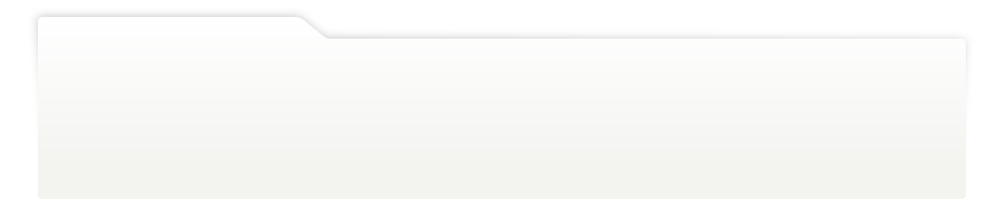
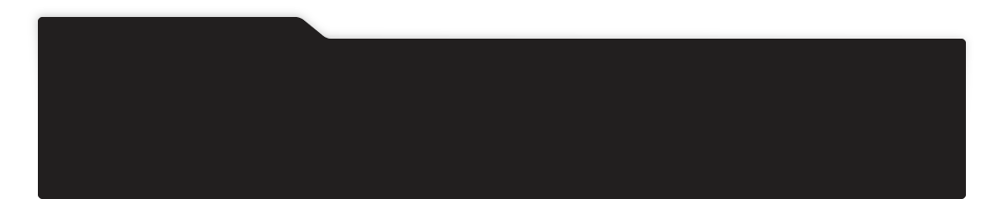
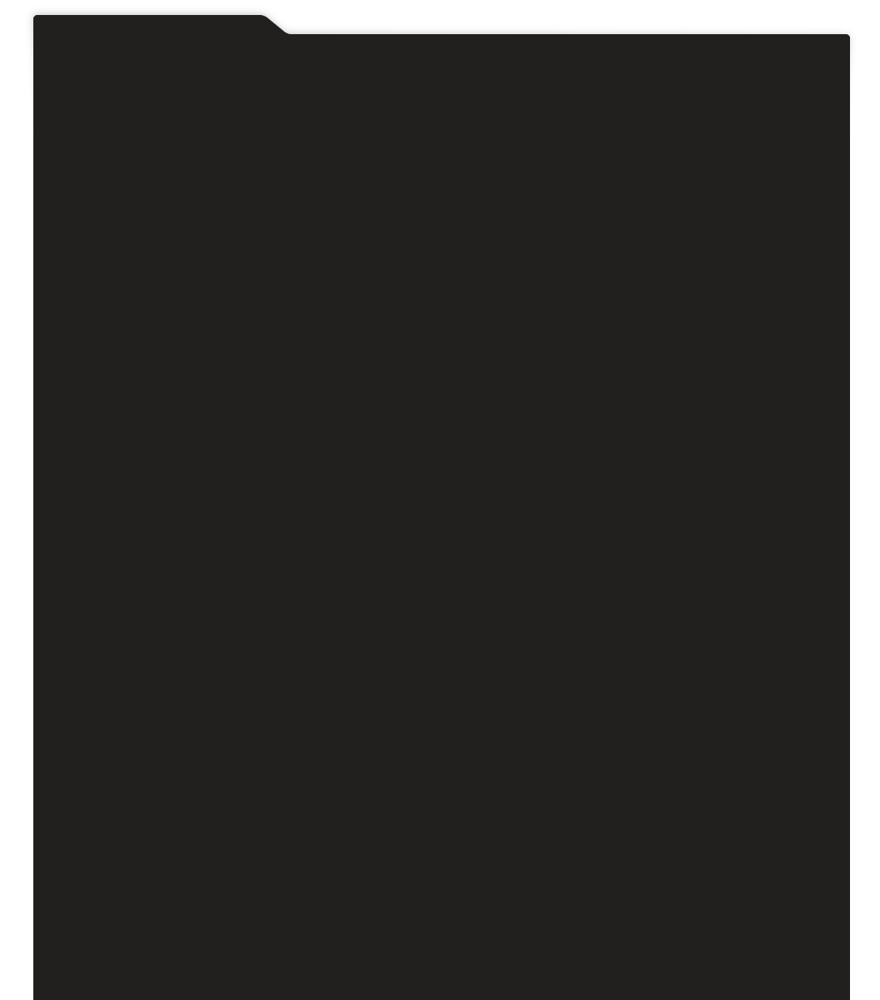
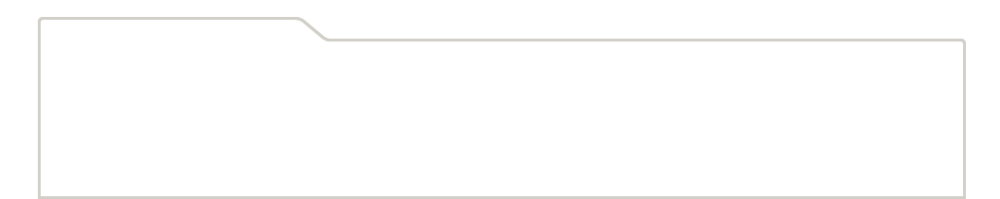
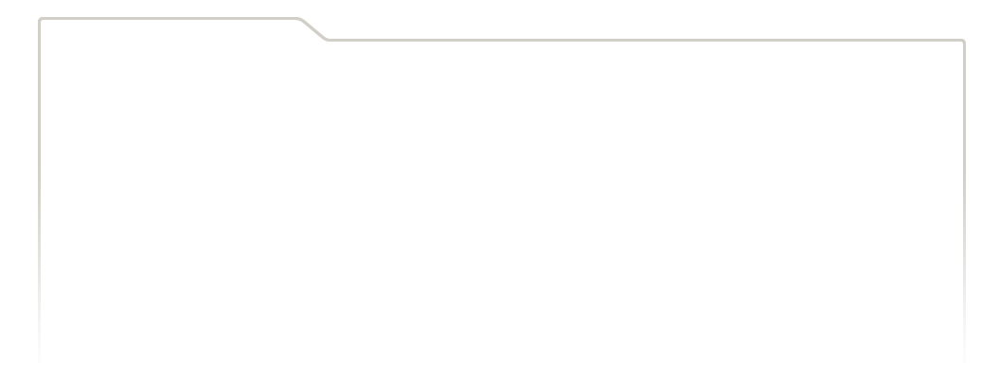
...
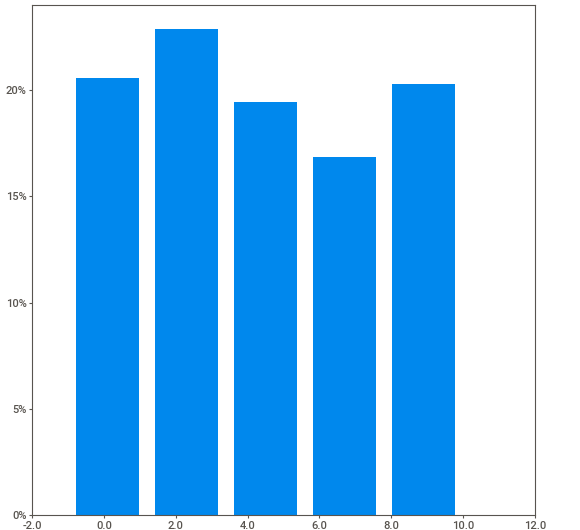
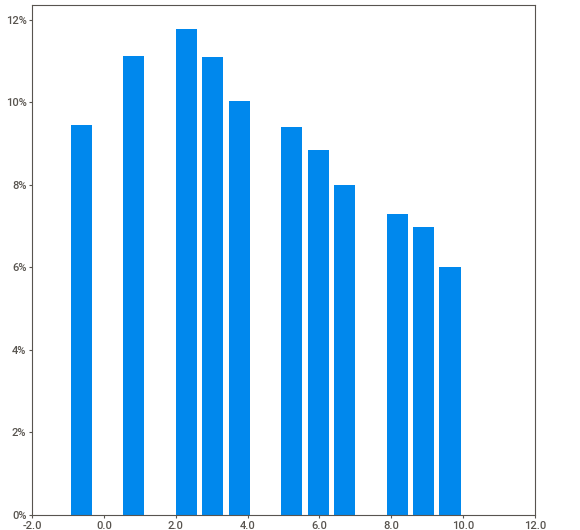
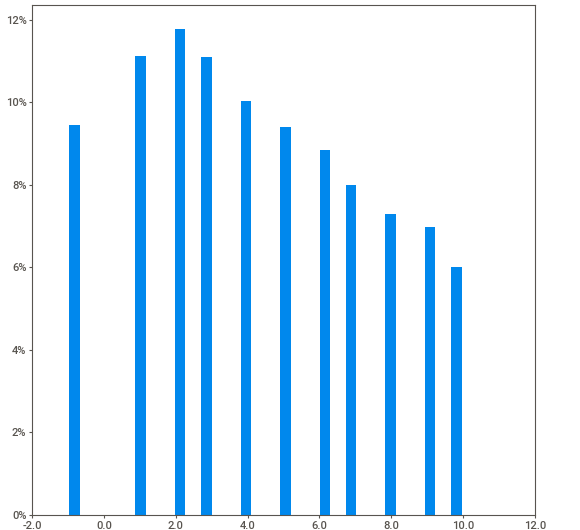
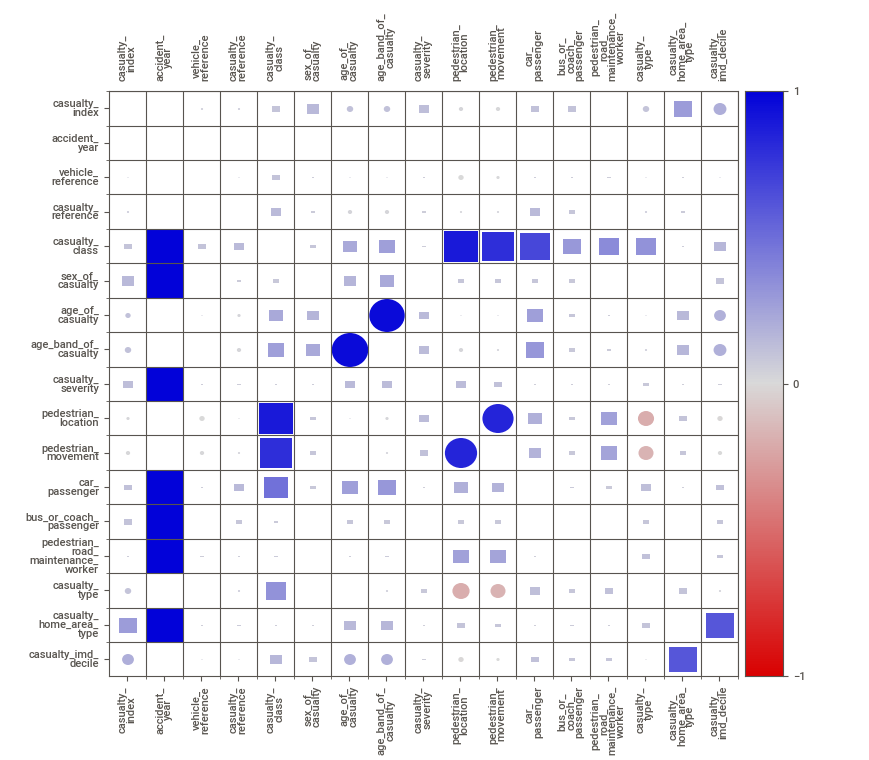
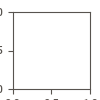

In [36]:
cas_df_profile = sv.analyze(cas_df_raw)



cas_df_profile.show_notebook()

In [37]:
cas_df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115584 entries, 0 to 115583
Data columns (total 19 columns):
 #   Column                              Non-Null Count   Dtype 
---  ------                              --------------   ----- 
 0   casualty_index                      115584 non-null  int64 
 1   accident_index                      115584 non-null  object
 2   accident_year                       115584 non-null  int64 
 3   accident_reference                  115584 non-null  object
 4   vehicle_reference                   115584 non-null  int64 
 5   casualty_reference                  115584 non-null  int64 
 6   casualty_class                      115584 non-null  int64 
 7   sex_of_casualty                     115584 non-null  int64 
 8   age_of_casualty                     115584 non-null  int64 
 9   age_band_of_casualty                115584 non-null  int64 
 10  casualty_severity                   115584 non-null  int64 
 11  pedestrian_location                 115

### Checking for NaNa values and Incorrect entries like -1

In [38]:
cas_df_raw.isna().sum() # checking for null values in casualty table

casualty_index                        0
accident_index                        0
accident_year                         0
accident_reference                    0
vehicle_reference                     0
casualty_reference                    0
casualty_class                        0
sex_of_casualty                       0
age_of_casualty                       0
age_band_of_casualty                  0
casualty_severity                     0
pedestrian_location                   0
pedestrian_movement                   0
car_passenger                         0
bus_or_coach_passenger                0
pedestrian_road_maintenance_worker    0
casualty_type                         0
casualty_home_area_type               0
casualty_imd_decile                   0
dtype: int64

In [39]:
cas_df_raw.isin([-1, '-1', ' ']).sum()

casualty_index                            0
accident_index                            0
accident_year                             0
accident_reference                        0
vehicle_reference                         0
casualty_reference                        0
casualty_class                            0
sex_of_casualty                         756
age_of_casualty                        2481
age_band_of_casualty                   2481
casualty_severity                         0
pedestrian_location                       2
pedestrian_movement                       2
car_passenger                           311
bus_or_coach_passenger                   22
pedestrian_road_maintenance_worker       94
casualty_type                             0
casualty_home_area_type               10762
casualty_imd_decile                   10910
dtype: int64

In [40]:
# Check for columns containing 99
cols_with_99 = cas_df_raw.columns[cas_df_raw.eq(99).any()]
print("\nColumns containing 99:")
print(cols_with_99)


Columns containing 99:
Index(['age_of_casualty'], dtype='object')


### Make a copy of the original Casualty DF before Cleaning

In [41]:
cas_df = cas_df_raw.copy()

#### age of causualty contains both -1 and 99, this might be considered for cleaning if it will be subsiquently used for analysis

In [42]:
# Passin the fucntion for cleaing casualty df
sub_nan_columns(cas_df)


In [43]:
cas_df.isin([-1, '-1', ' ']).sum() #code validation

casualty_index                            0
accident_index                            0
accident_year                             0
accident_reference                        0
vehicle_reference                         0
casualty_reference                        0
casualty_class                            0
sex_of_casualty                         756
age_of_casualty                        2481
age_band_of_casualty                   2481
casualty_severity                         0
pedestrian_location                       2
pedestrian_movement                       2
car_passenger                           311
bus_or_coach_passenger                   22
pedestrian_road_maintenance_worker       94
casualty_type                             0
casualty_home_area_type               10762
casualty_imd_decile                   10910
dtype: int64

# Lsoa Table (Exploration and Primary Data Cleaning)

In [44]:
lsoa_table = cur.execute(f"PRAGMA table_info(lsoa)").fetchall()
lsoa_table

[(0, 'objectid', '', 0, None, 1),
 (1, 'lsoa01cd', '', 0, None, 0),
 (2, 'lsoa01nm', '', 0, None, 0),
 (3, 'lsoa01nmw', '', 0, None, 0),
 (4, 'shape__area', '', 0, None, 0),
 (5, 'shape__length', '', 0, None, 0),
 (6, 'globalid', '', 0, None, 0)]

In [45]:
lsoa_df = pd.read_sql_query(""" SELECT* FROM lsoa """, con)
lsoa_df

,objectid,lsoa01cd,lsoa01nm,lsoa01nmw,shape__area,shape__length,globalid
0,1,E01000001,City of London 001A,City of London 001A,1.298652e+05,2635.772001,68cc6127-1008-4fbe-a16c-78fb089a7c43
1,2,E01000002,City of London 001B,City of London 001B,2.284189e+05,2707.986202,937edbc3-c1bf-4d35-b274-b0a1480a7c09
2,3,E01000003,City of London 001C,City of London 001C,5.905477e+04,1224.774479,2686dcaf-10b9-4736-92af-4788d4feaa69
3,4,E01000004,City of London 001D,City of London 001D,2.544551e+06,10718.466240,3c493140-0b3f-4b9a-b358-22011dc5fb89
4,5,E01000005,City of London 001E,City of London 001E,1.895782e+05,2275.809358,b569093d-788d-41be-816c-d6d7658b2311
...,...,...,...,...,...,...,...
34373,34374,W01001892,Cardiff 020D,Caerdydd 020D,2.699088e+05,2537.220060,1a25aa1e-5db5-4d32-8355-473409dbd69f
34374,34375,W01001893,Cardiff 010B,Caerdydd 010B,4.288488e+06,9807.284401,b6af5e24-eb2a-404a-98a6-a282037b3e10
34375,34376,W01001894,Cardiff 010C,Caerdydd 010C,3.337511e+05,2929.546177,72d16f53-115d-4926-936d-2f1b1d659d46
34376,34377,W01001895,Cardiff 010D,Caerdydd 010D,1.360174e+06,8141.281226,8e105eb9-f68e-4cdb-bca6-b49f6592cb71


                                             |          | [  0%]   00:00 -> (? left)


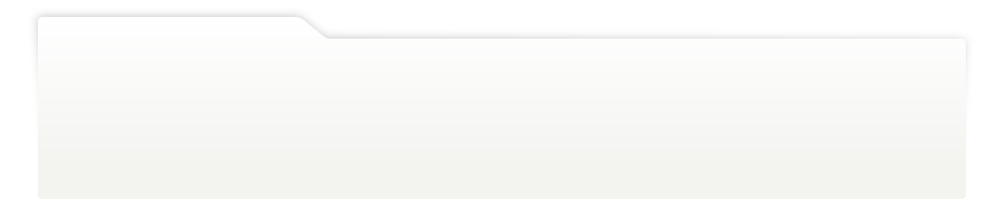
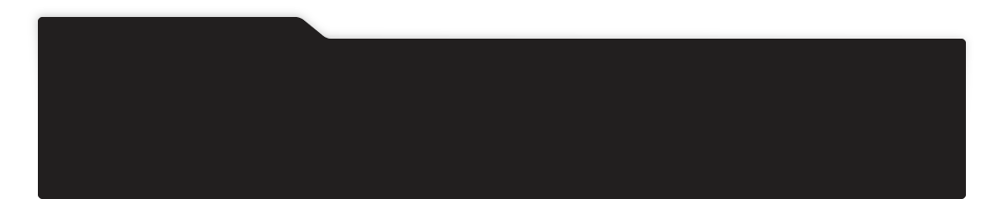
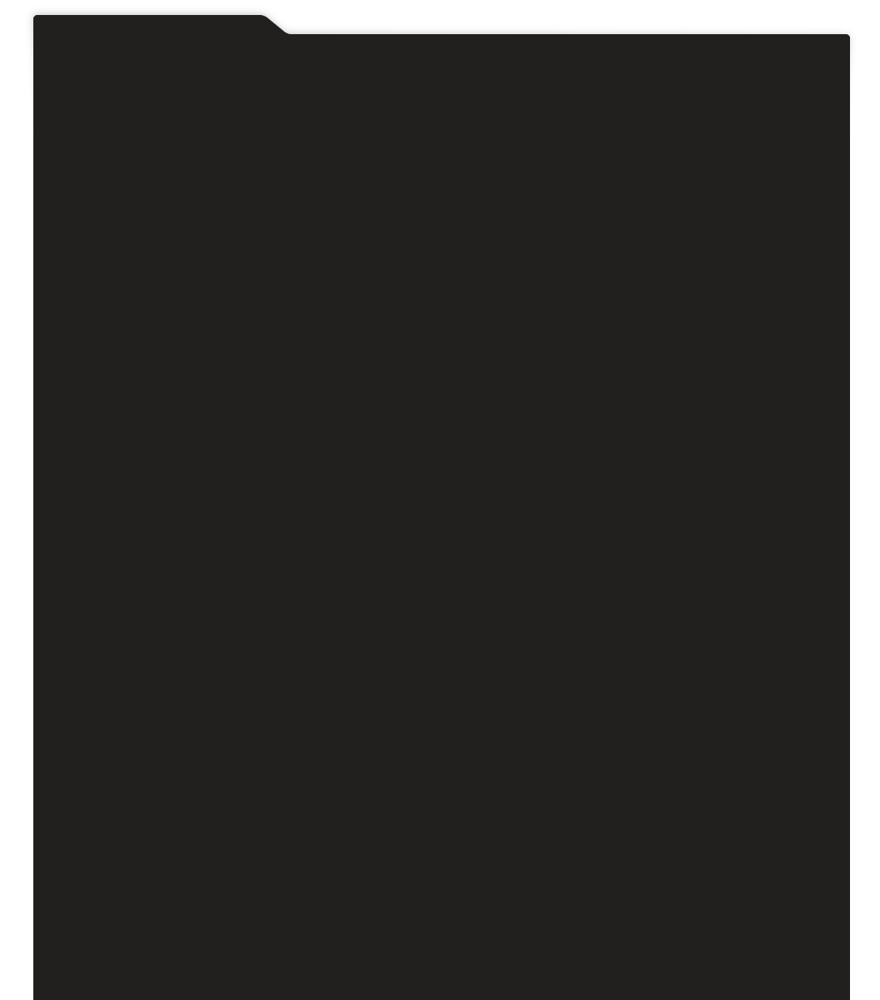
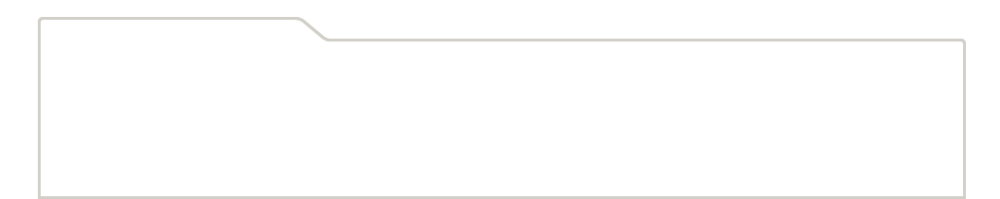
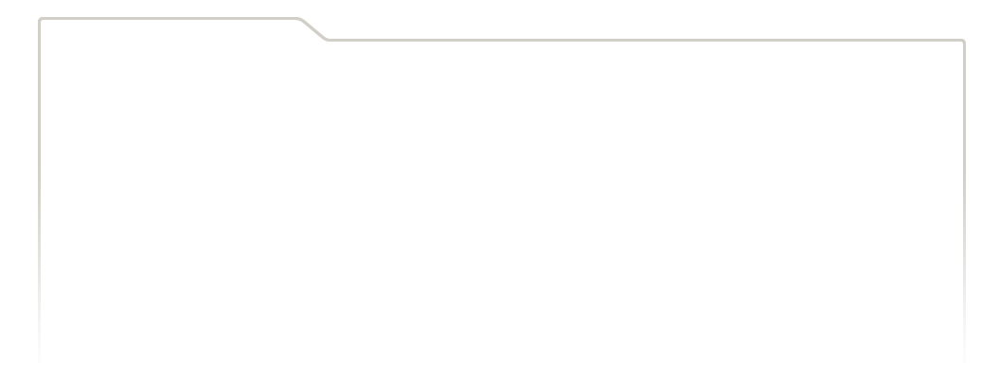
...
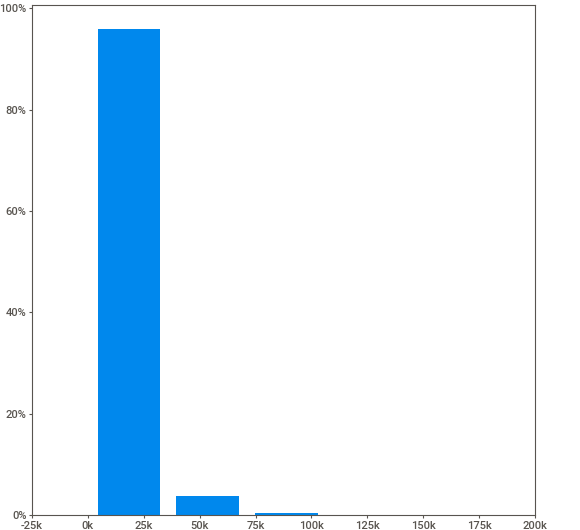
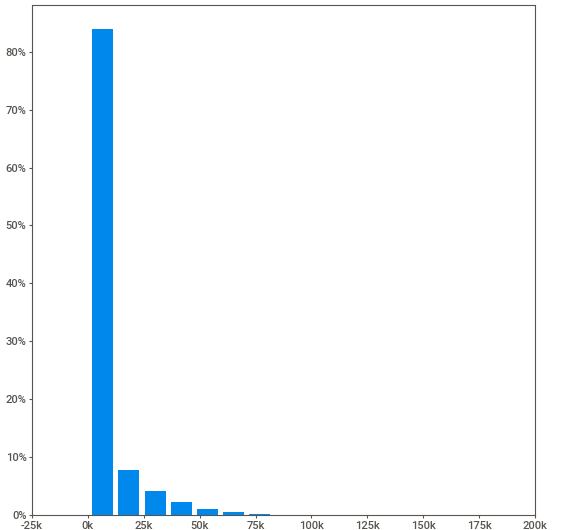
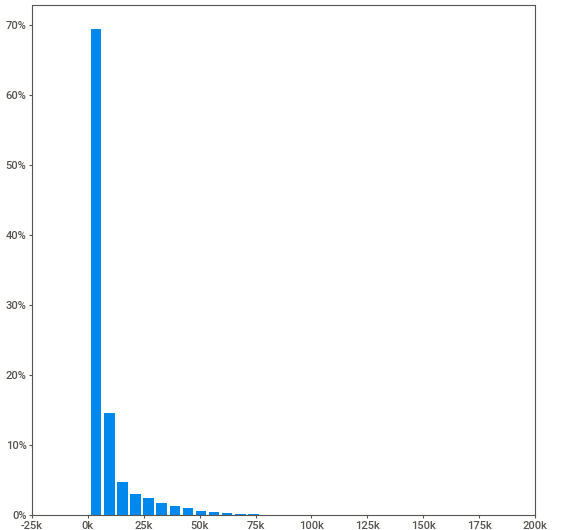
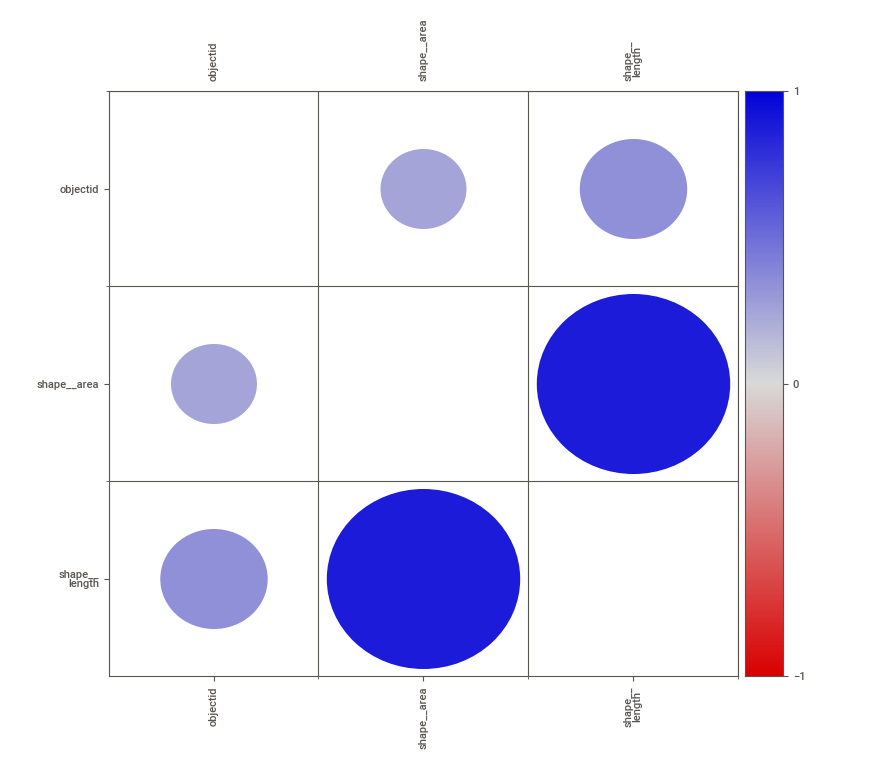
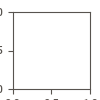

In [46]:
lsoa_df_profile = sv.analyze(lsoa_df)



lsoa_df_profile.show_notebook()

In [47]:
lsoa_df.isin([-1, '-1', ' ']).sum()

objectid         0
lsoa01cd         0
lsoa01nm         0
lsoa01nmw        0
shape__area      0
shape__length    0
globalid         0
dtype: int64

# Preparing the data that Will be Used for Modeling (Classication):
# The Complete Accident data (full_df_raw)

## First Raw Data and Merge all the Tables:
## acc_df_raw,
## veh_df_raw and
## cas_df_raw. (Initially Extracted From the Accident Data Base)

In [48]:
full_df_raw = acc_df_raw.merge(veh_df_raw, on="accident_index") \
               .merge(cas_df, on="accident_index")
full_df_raw

,accident_index,accident_year_x,accident_reference_x,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,1,3,1,...,6,3,9,5,0,0,0,0,1,4
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,1,3,1,1,0,0,0,0,1,2
2,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,1,3,1,1,0,0,0,0,1,2
3,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,1,3,1,...,5,3,5,9,0,0,0,0,1,3
4,2020010228006,2020,010228006,538676.0,184371.0,-0.001683,51.541210,1,2,1,...,8,2,4,1,0,0,0,0,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220430,2020991030297,2020,991030297,383664.0,810646.0,-2.271903,57.186317,99,2,2,...,7,2,0,0,0,0,0,5,2,9
220431,2020991030297,2020,991030297,383664.0,810646.0,-2.271903,57.186317,99,2,2,...,7,2,0,0,0,0,0,5,2,9
220432,2020991030900,2020,991030900,277161.0,674852.0,-3.968753,55.950940,99,3,2,...,11,3,0,0,0,0,0,1,1,9
220433,2020991030900,2020,991030900,277161.0,674852.0,-3.968753,55.950940,99,3,2,...,11,3,0,0,0,0,0,1,1,9


## Treating the Duplicated Rows
## even though there appears to be no duplicated rows but the origianl accident data frame with all unique accident_index appears to be duplicated due to the different casualty index and vehicle index having same accident index. All the one unique accident index will be use for the classification

In [49]:
full_df_raw.duplicated().sum()

0

In [50]:
raw_df_dp = full_df_raw.loc[:, full_df_raw.columns.duplicated()]
print(raw_df_dp.head())


# Dropping all duplicated columns
full_df_raw = full_df_raw.loc[:, ~full_df_raw.columns.duplicated()]

Empty DataFrame
Columns: []
Index: [0, 1, 2, 3, 4]


## Define a function to clean select on the unique rows

In [51]:
def unique_accident(data, unique_column_name):
    # Find all the rows where the unique_column_name is duplicated.
    find_duplicated_rows = data.duplicated(subset = unique_column_name, keep ="first")

    # Filter and return not_duplicated rows and the first of the duplicated rows
    unique_rows = full_df_raw[~find_duplicated_rows]

    # Drop all Objects from the dataframe

    acc_clean_row = unique_rows.select_dtypes(exclude=["object"])

    return acc_clean_row

In [52]:
# Applying the function
unique_col = "accident_index"
full_df_raw = unique_accident(full_df_raw,unique_col)
full_df_raw

,accident_year_x,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,day_of_week,...,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,2020,521389.0,175144.0,-0.254001,51.462262,1,3,1,1,3,...,6,3,9,5,0,0,0,0,1,4
1,2020,529337.0,176237.0,-0.139253,51.470327,1,3,1,2,2,...,1,3,1,1,0,0,0,0,1,2
3,2020,526432.0,182761.0,-0.178719,51.529614,1,3,1,1,4,...,5,3,5,9,0,0,0,0,1,3
4,2020,538676.0,184371.0,-0.001683,51.541210,1,2,1,1,4,...,8,2,4,1,0,0,0,0,1,3
5,2020,529324.0,181286.0,-0.137592,51.515704,1,3,1,2,4,...,6,3,6,9,0,0,0,0,1,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220427,2020,343034.0,731654.0,-2.926320,56.473539,99,2,2,1,4,...,3,2,0,0,0,0,0,1,1,2
220429,2020,257963.0,658891.0,-4.267565,55.802353,99,3,1,1,6,...,9,3,10,1,0,0,0,0,1,10
220430,2020,383664.0,810646.0,-2.271903,57.186317,99,2,2,1,4,...,7,2,0,0,0,0,0,5,2,9
220432,2020,277161.0,674852.0,-3.968753,55.950940,99,3,2,1,3,...,11,3,0,0,0,0,0,1,1,9


## Basic Data Cleaning and Preprocessing

In [53]:
print(full_df_raw.isna().sum())

accident_year_x                        0
location_easting_osgr                 14
location_northing_osgr                14
longitude                             14
latitude                              14
                                      ..
bus_or_coach_passenger                 0
pedestrian_road_maintenance_worker     0
casualty_type                          0
casualty_home_area_type                0
casualty_imd_decile                    0
Length: 71, dtype: int64


In [54]:
# Dropping all missing values
full_df_raw = full_df_raw.dropna()
full_df_raw.isna().sum() # code validation

accident_year_x                       0
location_easting_osgr                 0
location_northing_osgr                0
longitude                             0
latitude                              0
                                     ..
bus_or_coach_passenger                0
pedestrian_road_maintenance_worker    0
casualty_type                         0
casualty_home_area_type               0
casualty_imd_decile                   0
Length: 71, dtype: int64

In [55]:
# Make a XCopy of the original
full_raw_m1 = full_df_raw.copy()

# Secondary Cleaning of the Entire Data For Only Used for Modeling (Model_3) Purpose:

## Convert all -1 ro Na
## Convert all NaN in Numeric Variable Using the Median
## Convert all NaN in Categorical Variable Using the Mode
## Save the Clean Data in A Separate Variable  (full_df_clean)

## defien a function that converts all -1 to NaN

In [56]:
full_clean_m3 = full_df_raw.copy()

In [57]:
#Defining the function
def neg1_to_nan(dataframe):
    return dataframe.replace(-1, np.nan)
# Passing the dataFrame to the function
full_df_raw = neg1_to_nan(full_df_raw)
 # Checking for any remaining missing values
full_df_raw.isna().sum()

accident_year_x                          0
location_easting_osgr                    0
location_northing_osgr                   0
longitude                                0
latitude                                 0
                                      ... 
bus_or_coach_passenger                  20
pedestrian_road_maintenance_worker      85
casualty_type                            0
casualty_home_area_type               8028
casualty_imd_decile                   8139
Length: 71, dtype: int64

## define a function that converts NaN

In [58]:
# Defining the function
def nan_to_median_and_mode(dataframe):
    numerical_cols = dataframe.select_dtypes(include=[np.number]).columns
    categorical_cols = dataframe.select_dtypes(include=['object', 'category']).columns

    # Fill NaN in numerical columns with median
    for col in numerical_cols:
        median_val = dataframe[col].median()
        dataframe[col].fillna(median_val, inplace=True)

    # Fill NaN in categorical columns with mode
    for col in categorical_cols:
        mode_val = dataframe[col].mode().iloc[0]
        dataframe[col].fillna(mode_val, inplace=True)

In [59]:
## Applying the function to the dataframe
nan_to_median_and_mode(full_clean_m3)

# Checking to confirm there are no more NAN values
full_clean_m3.isna().sum()

accident_year_x                       0
location_easting_osgr                 0
location_northing_osgr                0
longitude                             0
latitude                              0
                                     ..
bus_or_coach_passenger                0
pedestrian_road_maintenance_worker    0
casualty_type                         0
casualty_home_area_type               0
casualty_imd_decile                   0
Length: 71, dtype: int64

## The New Data Frame Generated and Their Purpose (Use) For this Project:
## 1) acc_df, veh_df, cas_df: Used for the Analysis of (Q.1 to Q.6)
## 2) full_raw_m1: Raw data with -1 : Used for Model_1 and Model_2
## 3) full_clean_m3: Clean data without -1: Used for Model_3

# DATA ANALYSIS


## Some column are subseted based for the Analysis

## Q. 1: Are there significant hours of the day, and days of the week, on which accidents occur?

### Extract from accident table the following accident_index, time,	day_of_week for the analysis of this question

In [60]:
acc_df

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,1,3,1,...,9,1,9,9,0,0,1,3,2,E01004576
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,4,1,1,1,0,0,1,1,2,E01003034
2,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,1,3,1,...,0,4,1,2,0,0,1,1,2,E01004726
3,2020010228006,2020,010228006,538676.0,184371.0,-0.001683,51.541210,1,2,1,...,4,4,1,1,0,0,1,1,2,E01003617
4,2020010228011,2020,010228011,529324.0,181286.0,-0.137592,51.515704,1,3,1,...,0,4,1,1,0,0,1,1,2,E01004763
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91194,2020991027064,2020,991027064,343034.0,731654.0,-2.926320,56.473539,99,2,2,...,0,1,1,1,0,0,1,1,-1,-1
91195,2020991029573,2020,991029573,257963.0,658891.0,-4.267565,55.802353,99,3,1,...,0,1,1,1,0,0,1,2,-1,-1
91196,2020991030297,2020,991030297,383664.0,810646.0,-2.271903,57.186317,99,2,2,...,0,1,1,1,0,0,2,1,-1,-1
91197,2020991030900,2020,991030900,277161.0,674852.0,-3.968753,55.950940,99,3,2,...,0,1,1,1,0,0,1,2,-1,-1


### Extracting time and day from the accident df

In [61]:
# extracting time and day from the accident df
acc_day_time = acc_df[["accident_index", "time", "day_of_week"]]
acc_day_time

,accident_index,time,day_of_week
0,2020010219808,09:00,3
1,2020010220496,13:55,2
2,2020010228005,01:25,4
3,2020010228006,01:50,4
4,2020010228011,02:25,4
...,...,...,...
91194,2020991027064,14:30,4
91195,2020991029573,15:05,6
91196,2020991030297,12:42,4
91197,2020991030900,14:00,3


### Defining a Function to Creating a New Column For The Time Intervals (1 hour)

In [62]:
def time_interval_info(time):
    hours, minutes = map(int, time.split(":"))
    total_minutes = hours * 60 + minutes

    # per hour intervals
    interval_length = 24 * 60 // 24
    interval_start = (total_minutes // interval_length) * interval_length

    # to keep the end of interval within the same hour
    interval_end = interval_start + interval_length - 1

    interval_start_hour = interval_start // 60
    interval_start_minute = interval_start % 60
    interval_end_hour = interval_end // 60
    interval_end_minute = interval_end % 60

    return f"{interval_start_hour:02d}:{interval_start_minute:02d} - {interval_end_hour:02d}:{interval_end_minute:02d}"

In [63]:
# applying the funtion on the dataset
acc_day_time["time_interval"] = acc_day_time["time"].apply(time_interval_info)

acc_day_time

,accident_index,time,day_of_week,time_interval
0,2020010219808,09:00,3,09:00 - 09:59
1,2020010220496,13:55,2,13:00 - 13:59
2,2020010228005,01:25,4,01:00 - 01:59
3,2020010228006,01:50,4,01:00 - 01:59
4,2020010228011,02:25,4,02:00 - 02:59
...,...,...,...,...
91194,2020991027064,14:30,4,14:00 - 14:59
91195,2020991029573,15:05,6,15:00 - 15:59
91196,2020991030297,12:42,4,12:00 - 12:59
91197,2020991030900,14:00,3,14:00 - 14:59


## Checking For Significant Hours of The Day

In [64]:
acc_group = acc_day_time["time_interval"].value_counts().sort_index()
acc_time_df = pd.DataFrame({"Total Count": acc_group})

acc_time_df.index.names =["Time Intervals"]
acc_time_df.reset_index(inplace=True)


# Viewing the accident time interval data frame
acc_time_df

,Time Intervals,Total Count
0,00:00 - 00:59,1188
1,01:00 - 01:59,915
2,02:00 - 02:59,658
3,03:00 - 03:59,566
4,04:00 - 04:59,508
5,05:00 - 05:59,855
6,06:00 - 06:59,1830
7,07:00 - 07:59,3736
8,08:00 - 08:59,5267
9,09:00 - 09:59,3917


### Plotting the Significant Accident Hours of The Day

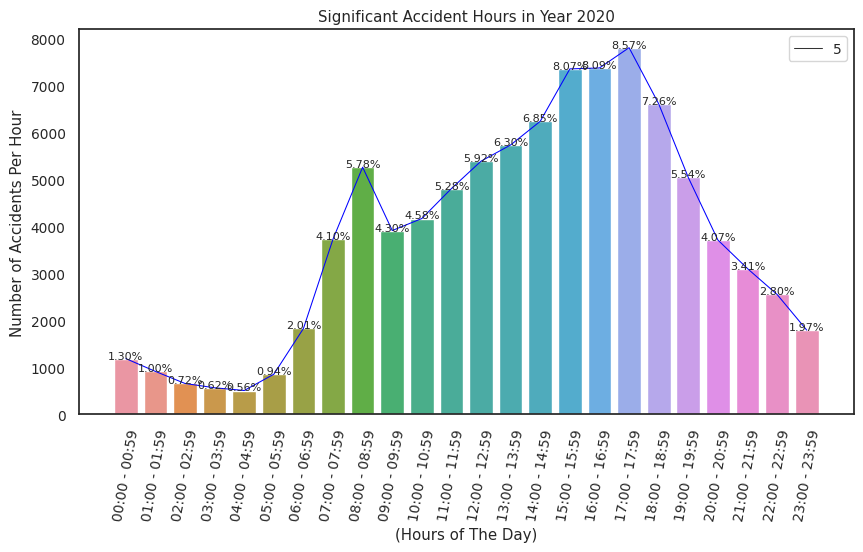

In [65]:
# ploting the time interval in hours against the frequency of occurance of accident
sns.set(font_scale= 0.9)
sns.set_style("white")
plt.figure(figsize=(10,5))
plt.xticks(rotation=80)
resolution_value = 3000

# Calculate percentages
total_counts = acc_time_df["Total Count"].sum()
for index, value in enumerate(acc_time_df["Total Count"]):
    percentage = (value / total_counts) * 100
    plt.text(index, value, f'{percentage:.2f}%', ha='center', fontsize=8)
accident_hours = sns.barplot(data=acc_time_df, x="Time Intervals", y="Total Count")

# Line plot tracing the heights of the bars
sns.lineplot(data=acc_time_df, x="Time Intervals", y="Total Count", color="blue", size= 5)

plt.title("Significant Accident Hours in Year 2020")
accident_hours.set(xlabel= "(Hours of The Day)", ylabel= "Number of Accidents Per Hour")


plt.savefig("Hours of Accident.png", dpi=resolution_value)
plt.show()

### Plotting Graphical representation of The Significant Accident Hours of Day

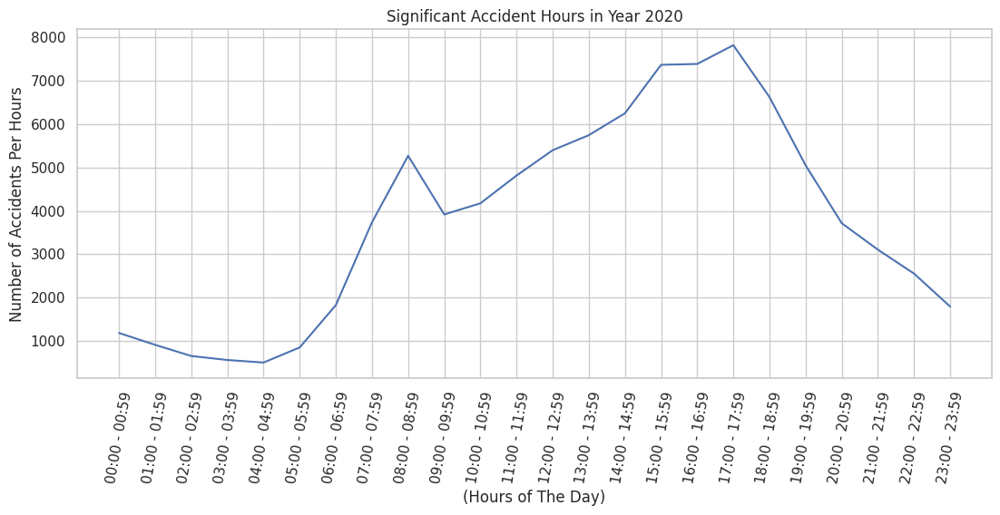

In [66]:
sns.set(font_scale= 1)
sns.set_style("whitegrid")
plt.figure(figsize=(13,5))
plt.xticks(rotation=80)


accident_hours = sns.lineplot(data=acc_time_df, x="Time Intervals", y="Total Count")

plt.title("Significant Accident Hours in Year 2020")
accident_hours.set(xlabel= "(Hours of The Day)", ylabel= "Number of Accidents Per Hours")

plt.savefig("Hours of Accident Graph.png")
plt.show()

### Significan Days of The Week, on Which Accidents Occur

In [67]:
acc_day = acc_day_time["day_of_week"].value_counts().sort_index()
acc_day_df = pd.DataFrame({"Accidents Per Day Count": acc_day})

acc_day_df.index.names =["Days"]
acc_day_df.reset_index(inplace=True)


# Viewing the accident time interval data frame
acc_day_df

,Days,Accidents Per Day Count
0,1,10315
1,2,12772
2,3,13267
3,4,13564
4,5,14056
5,6,14889
6,7,12336


### Plotting the Significant Accident Day of The Week (in Actual Days of the Week)
#### From the accident data sheet the days of the week are numbered represent,
1: "Sunday",
2: "Monday",
3: "Tuesday",
4: "Wednesday",
5: "Thursday",
6: "Friday",
7: "Saturday"

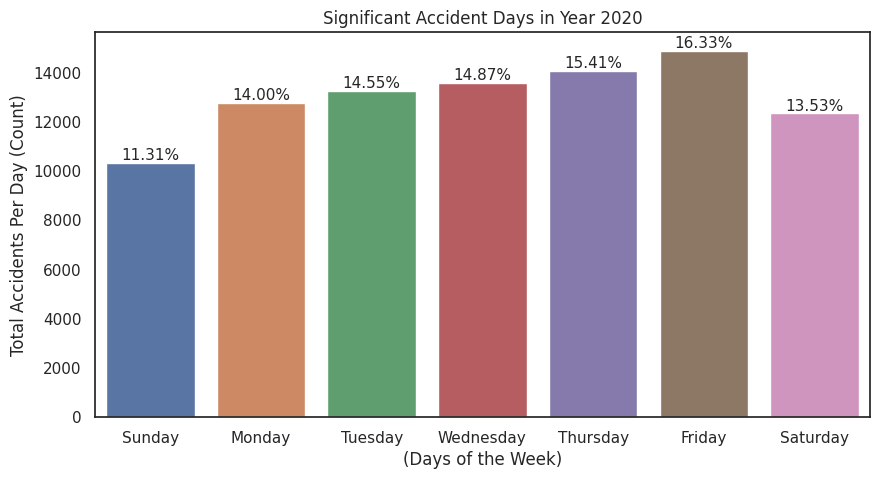

In [68]:
# Dictionary to map day numbers to day names
day_names = {
    1: "Sunday",
    2: "Monday",
    3: "Tuesday",
    4: "Wednesday",
    5: "Thursday",
    6: "Friday",
    7: "Saturday",
}

sns.set(font_scale=1)
sns.set_style("white")
plt.figure(figsize=(10, 5))

# Convert day numbers to day names for the legend
days = sorted(acc_day_df["Days"].unique())
day_labels = [day_names[day] for day in days]

accident_days = sns.barplot(data=acc_day_df, x="Days", y="Accidents Per Day Count")
accident_days.set_xticklabels(day_labels)  # Set day names as x-axis labels

# Calculate percentages
total_counts = acc_day_df["Accidents Per Day Count"].sum()
for index, value in enumerate(acc_day_df["Accidents Per Day Count"]):
    percentage = (value / total_counts) * 100
    plt.text(index, value, f'{percentage:.2f}%', ha='center', va='bottom', fontsize=11)

# plt.legend(day_labels, title="Days")  # Add legend with day names
plt.title("Significant Accident Days in Year 2020")
plt.xlabel("(Days of the Week)")
plt.ylabel("Total Accidents Per Day (Count)")

plt.savefig("Days_of_Accident.png", dpi = 2000)
plt.show()

### Plotting Graphical representation of The Significant Accident Day of The Week

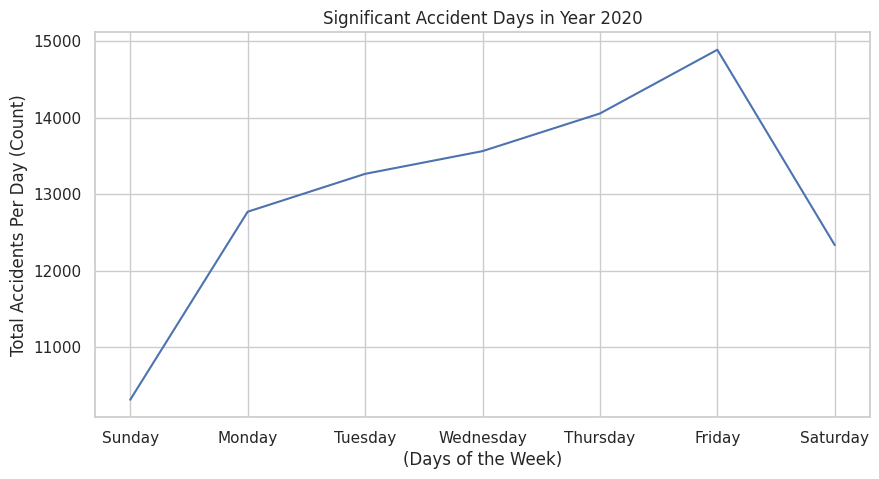

In [69]:
# Plotting Graphical representation of The Significant Accident Day of The Week

sns.set(font_scale=1)
sns.set_style("whitegrid")
plt.figure(figsize=(10, 5))

accident_days = sns.lineplot(data=acc_day_df, x="Days", y="Accidents Per Day Count")
accident_days.set_xticks(days)  # Set the x-axis ticks to be the numerical day values
accident_days.set_xticklabels(day_labels)  # Set day names as x-axis labels

plt.title("Significant Accident Days in Year 2020")
plt.xlabel("(Days of the Week)")
plt.ylabel("Total Accidents Per Day (Count)")

plt.savefig("Days_of_Accident graph.png")
plt.show()

## Q. 2: For motorbikes, are there significant hours of the day, and days of the week, on which accidents occur? We suggest a focus on: Motorcycle 125cc and under, Motorcycle over 125cc and up to 500cc, and Motorcycle over 500cc.

### Merging Accident and Vehicle Data for this Analysis (acc_dt and veh_df)

In [70]:
acc_veh_df = pd.merge(acc_df, veh_df, on = "accident_index")
acc_veh_df

,accident_index,accident_year_x,accident_reference_x,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,1,3,1,...,6,2,32,6,1968,2,6,AUDI Q5,4,1
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,2,1,45,7,1395,1,2,AUDI A1,7,1
2,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,1,3,1,...,6,3,-1,-1,-1,-1,-1,-1,-1,-1
3,2020010228006,2020,010228006,538676.0,184371.0,-0.001683,51.541210,1,2,1,...,1,1,44,7,1798,8,8,TOYOTA PRIUS,2,1
4,2020010228011,2020,010228011,529324.0,181286.0,-0.137592,51.515704,1,3,1,...,6,1,20,4,2993,2,4,BMW 4 SERIES,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167370,2020991030297,2020,991030297,383664.0,810646.0,-2.271903,57.186317,99,2,2,...,1,1,57,9,1968,2,2,AUDI A5,7,1
167371,2020991030297,2020,991030297,383664.0,810646.0,-2.271903,57.186317,99,2,2,...,5,1,38,7,1301,1,2,KTM 1290 SUPERDUKE,9,2
167372,2020991030900,2020,991030900,277161.0,674852.0,-3.968753,55.950940,99,3,2,...,6,2,68,10,1995,2,1,BMW X3,5,1
167373,2020991030900,2020,991030900,277161.0,674852.0,-3.968753,55.950940,99,3,2,...,6,1,76,11,-1,-1,-1,-1,9,1


In [71]:
acc_veh_df.duplicated().sum() # checking for duplicted rows

0

### Extracting the Columns needed to run this analysis,	accident_index,	vehicle_index, time, day_of_week, vehicle_ytpe

In [72]:
acc_veh_daytime = acc_veh_df[["accident_index", "vehicle_index", "time", "day_of_week", "vehicle_type"]]
acc_veh_daytime

,accident_index,vehicle_index,time,day_of_week,vehicle_type
0,2020010219808,681716,09:00,3,9
1,2020010220496,681717,13:55,2,9
2,2020010228005,681718,01:25,4,9
3,2020010228006,681719,01:50,4,8
4,2020010228011,681720,02:25,4,9
...,...,...,...,...,...
167370,2020991030297,849086,12:42,4,9
167371,2020991030297,849087,12:42,4,5
167372,2020991030900,849088,14:00,3,9
167373,2020991030900,849089,14:00,3,1


In [73]:
acc_veh_daytime.duplicated().sum()

0

### Extracting the Columns needed to run this analysis, time, day_of_week, vehicle_type i.e Motorcycle 125cc and Under, Motorcycle Over 125cc and up to 500cc, and Motorcycle Over 500cc (which vehicle_type: 3, 4 and 5)

In [74]:
acc_motocycle = acc_veh_daytime.loc[(acc_veh_daytime["vehicle_type"] == 3)|
                                          (acc_veh_daytime["vehicle_type"] == 4)|
                                          (acc_veh_daytime["vehicle_type"] == 5)]
acc_motocycle

,accident_index,vehicle_index,time,day_of_week,vehicle_type
12,2020010228020,681728,03:25,4,3
33,2020010228086,681749,14:00,4,3
36,2020010228097,681752,14:37,4,3
58,2020010228148,681774,19:05,4,3
77,2020010228207,681793,14:29,4,3
...,...,...,...,...,...
167195,2020991010130,848911,16:30,5,3
167292,2020991011809,849008,17:30,4,3
167301,2020991012311,849017,17:55,2,3
167304,2020991012353,849020,15:45,5,4


In [75]:
acc_motocycle.duplicated().sum() # checking for duplicated rows

0

### Grouping the time into 1 hour interval

In [76]:
# applying the funtion on the dataset
acc_motocycle["time_interval"] = acc_motocycle["time"].apply(time_interval_info)

acc_motocycle

,accident_index,vehicle_index,time,day_of_week,vehicle_type,time_interval
12,2020010228020,681728,03:25,4,3,03:00 - 03:59
33,2020010228086,681749,14:00,4,3,14:00 - 14:59
36,2020010228097,681752,14:37,4,3,14:00 - 14:59
58,2020010228148,681774,19:05,4,3,19:00 - 19:59
77,2020010228207,681793,14:29,4,3,14:00 - 14:59
...,...,...,...,...,...,...
167195,2020991010130,848911,16:30,5,3,16:00 - 16:59
167292,2020991011809,849008,17:30,4,3,17:00 - 17:59
167301,2020991012311,849017,17:55,2,3,17:00 - 17:59
167304,2020991012353,849020,15:45,5,4,15:00 - 15:59


## Checking For Significant Hours of The Day for motocycle Accidents(vehicle class: 3, 4, 5)

In [77]:
acc_group_motocycle = acc_motocycle["time_interval"].value_counts().sort_index() # Calculate the frequency of accidents for each time interval
acc_time_motocycle = pd.DataFrame({"Total Count": acc_group_motocycle})   # Create a new DataFrame to store the total accident count per time interval

acc_time_motocycle.index.names =["Time Intervals"]     # Set the name of the index in the DataFrame to "Time Intervals"
acc_time_motocycle.reset_index(inplace=True)


# Viewing the accident time interval data frame
acc_time_motocycle

,Time Intervals,Total Count
0,00:00 - 00:59,96
1,01:00 - 01:59,90
2,02:00 - 02:59,43
3,03:00 - 03:59,37
4,04:00 - 04:59,41
5,05:00 - 05:59,111
6,06:00 - 06:59,243
7,07:00 - 07:59,531
8,08:00 - 08:59,445
9,09:00 - 09:59,388


### Plotting the Significant Accident Time for Motorbike (vehicle class: 3, 4, 5)

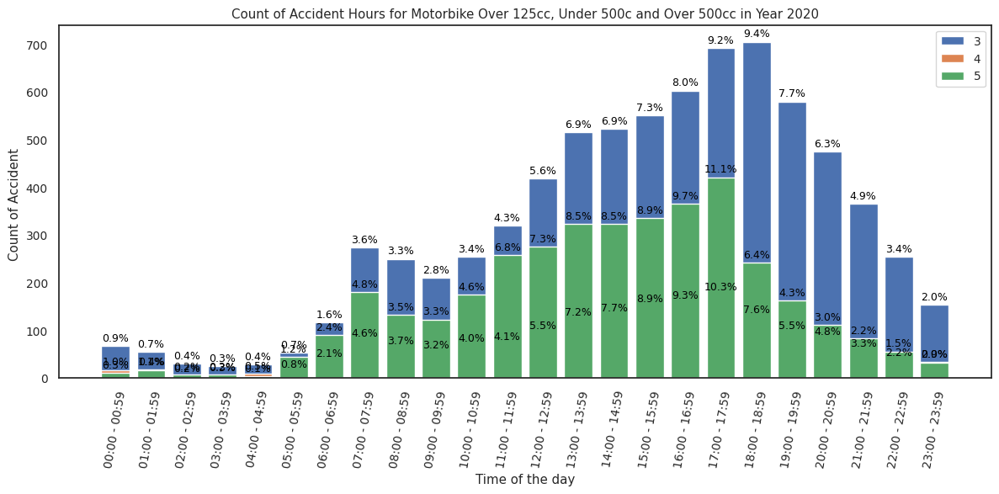

In [78]:
acc_motocycle["time_interval"] = acc_motocycle["time"].apply(time_interval_info)

# Group by 'vehicle_type' and count occurrences of each time value
grouped = acc_motocycle.groupby('vehicle_type')['time_interval'].value_counts()

sns.set(font_scale=0.9)
sns.set_style("white")
plt.figure(figsize=(12, 6))
plt.xticks(rotation=80)

# For each unique vehicle_type, plot a bar and add percentage
for vehicle_type in acc_motocycle['vehicle_type'].unique():
    counts = grouped[vehicle_type].sort_index()
    bars = plt.bar(counts.index, counts.values, label=vehicle_type)

    # Total count for current vehicle type
    total_for_vehicle = counts.sum()

    # Adding percentage above each bar
    for bar in bars:
        height = bar.get_height()
        percentage = 100 * height / total_for_vehicle
        plt.text(bar.get_x() + bar.get_width() / 2, height + 5, f'{percentage:.1f}%',
                 ha='center', va='bottom', fontsize=9, color='black')

plt.xlabel('Time of the day')
plt.ylabel('Count of Accident ')
plt.title('Count of Accident Hours for Motorbike Over 125cc, Under 500c and Over 500cc in Year 2020')
plt.legend()
plt.tight_layout()

plt.show()

### Graph Representation of the Significant Accident Time for Motorbike (vehicle class: 3, 4, 5)

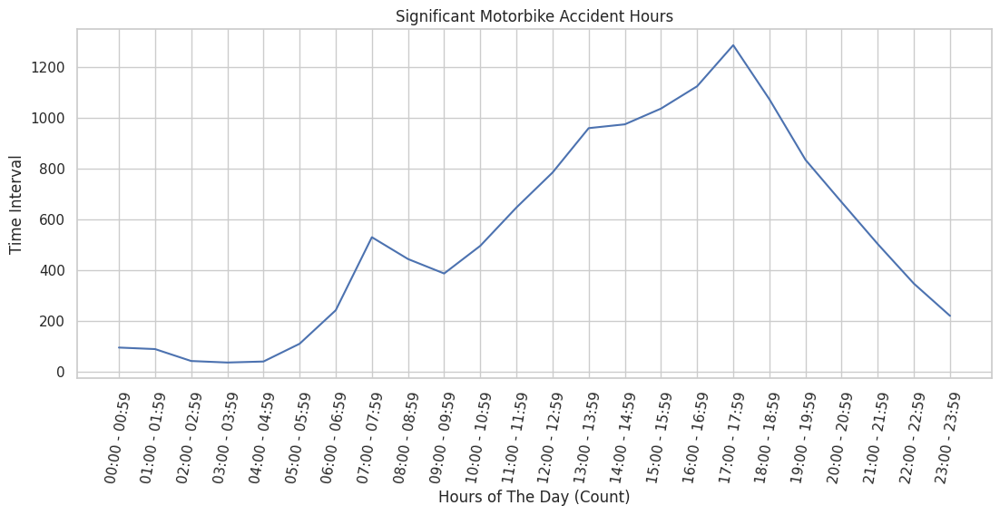

In [79]:
# ploting the time interval in hours against the frequency of occurance of accident graph
sns.set(font_scale= 1)
sns.set_style("whitegrid")
plt.figure(figsize=(13,5))
plt.xticks(rotation=80)


acc_hours_motocycle = sns.lineplot(data=acc_time_motocycle, x="Time Intervals", y="Total Count")

plt.title("Significant Motorbike Accident Hours")
acc_hours_motocycle.set(xlabel= "Hours of The Day (Count)", ylabel= "Time Interval")

plt.savefig("Hours of Motorbike Accident Graph.png")

### Significant Accident Days for Motorbike

In [80]:
acc_day_group = acc_motocycle["day_of_week"].value_counts().sort_index()
acc_day_motocycle_count = pd.DataFrame({"Motocycle Accidents Per Day Count": acc_day_group})

acc_day_motocycle_count.index.names =["Days"]
acc_day_motocycle_count.reset_index(inplace=True)


# Viewing the accident time interval data frame
acc_day_motocycle_count

,Days,Motocycle Accidents Per Day Count
0,1,1738
1,2,1703
2,3,1765
3,4,1841
4,5,2002
5,6,2119
6,7,1830


### Plotting the Significant Accident Days for Motorbike in Actual Days of The Week (vehicle class: 2, 3, 4, 5)

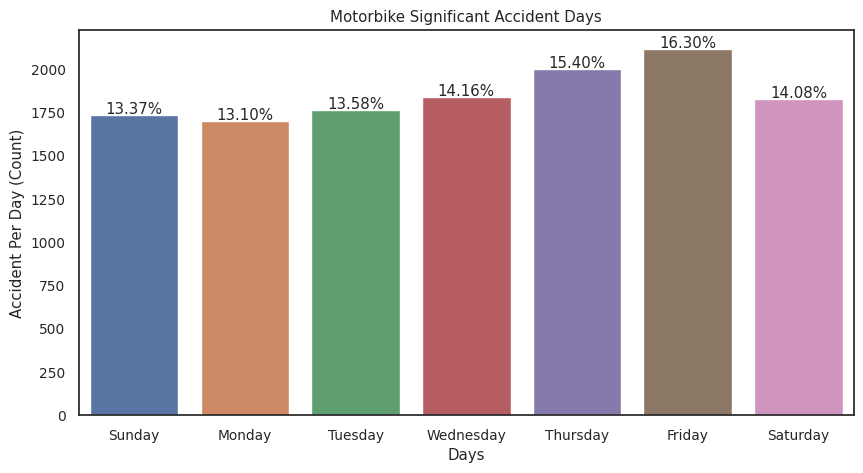

In [81]:
# ploting the time interval in hours against the frequency of occurance of accident
day_names = {
    1: "Sunday",
    2: "Monday",
    3: "Tuesday",
    4: "Wednesday",
    5: "Thursday",
    6: "Friday",
    7: "Saturday",
}

sns.set(font_scale=0.9)
sns.set_style("white")
plt.figure(figsize=(10, 5))

acc_day_motocycle = sns.barplot(data=acc_day_motocycle_count, x= "Days", y= "Motocycle Accidents Per Day Count")

# Calculate the total count of accidents
total = acc_day_motocycle_count['Motocycle Accidents Per Day Count'].sum()

# Add percentage for each bar
for p in acc_day_motocycle.patches:
    height = p.get_height()
    acc_day_motocycle.text(p.get_x() + p.get_width()/2.,
            height + 3,
            '{:1.2f}'.format((height/total)*100) + '%',
            ha="center")

# Convert day numbers to day names for the x-axis labels
acc_day_motocycle.set_xticklabels([day_names[day] for day in acc_day_motocycle_count["Days"]])

plt.title("Motorbike Significant Accident Days")
acc_day_motocycle.set(xlabel= "Days", ylabel= "Accident Per Day (Count)")
plt.savefig("Motobike Days of Accident.png")

plt.show()

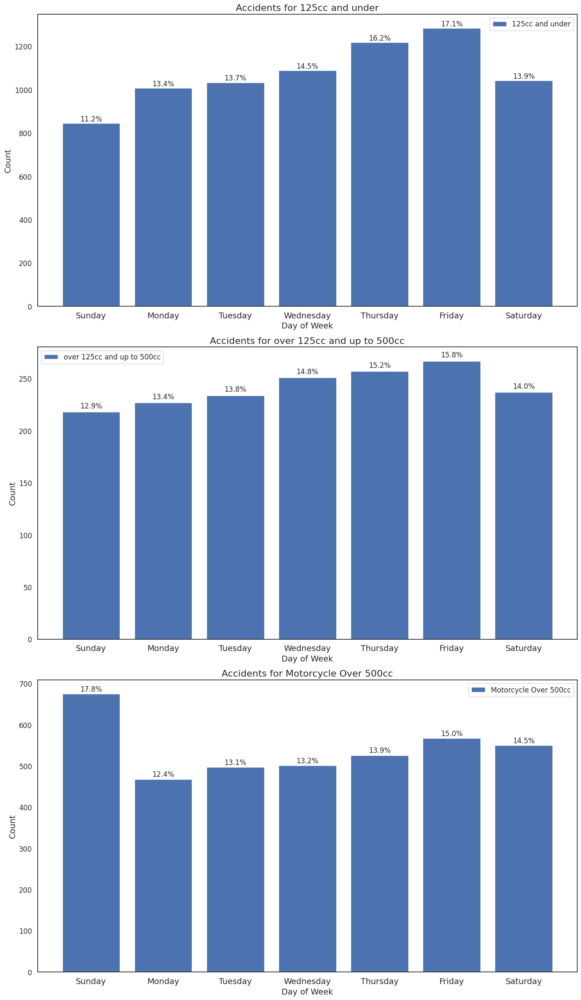

In [82]:
# Day names dictionary
day_names = {
    1: "Sunday",
    2: "Monday",
    3: "Tuesday",
    4: "Wednesday",
    5: "Thursday",
    6: "Friday",
    7: "Saturday",
}

# Motorcycle type dictionary
motobike_type = {
    3: "125cc and under",
    4: "over 125cc and up to 500cc",
    5: "Motorcycle Over 500cc"
}

# Group by 'vehicle_type' and count occurrences of each day_of_week value
grouped = acc_motocycle.groupby("vehicle_type")["day_of_week"].value_counts()

vehicle_types = acc_motocycle["vehicle_type"].unique()

# Define number of rows and columns for subplots
n_rows = len(vehicle_types)
n_cols = 1

fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 8 * n_rows))

for idx, vehicle_type in enumerate(vehicle_types):
    ax = axes[idx]

    counts = grouped[vehicle_type].sort_index()
    total_count = counts.sum()
    percentages = (counts / total_count) * 100  # Calculate percentages

    # Filter out days of the week that are not present in the current vehicle type's data
    valid_days = counts.index
    bars = ax.bar(valid_days, counts.values, label=motobike_type[vehicle_type])

    # Add percentage values above each bar
    for bar, day in zip(bars, valid_days):
        count = counts[day]
        percentage = percentages[day]
        ax.text(bar.get_x() + bar.get_width()/2, count + 2, f"{percentage:.1f}%", ha="center", va="bottom", fontsize=12)

    ax.set_xlabel("Day of Week", fontsize=14)
    ax.set_ylabel("Count", fontsize=14)
    ax.set_title(f"Accidents for {motobike_type[vehicle_type]}", fontsize=16)
    ax.legend(fontsize=12)
    ax.set_xticks(list(day_names.keys()))
    ax.set_xticklabels(list(day_names.values()), rotation=0, fontsize=14)
    ax.tick_params(axis='y', labelsize=12)

plt.tight_layout()
plt.savefig("MotorCycle_type Daily accident.png")
plt.show()


## Q. 3: For pedestrians involved in accidents, are there significant hours of the day, and days of the week, on which they are more likely to be involved?

### For this analysis, merge the accident and casualty data set (acc_df and cas_df)

In [83]:
acc_cas_df = pd.merge(acc_df, cas_df, on = "accident_index")
acc_cas_df

,accident_index,accident_year_x,accident_reference_x,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,1,3,1,...,6,3,9,5,0,0,0,0,1,4
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,1,3,1,1,0,0,0,0,1,2
2,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,1,3,1,1,0,0,0,0,1,2
3,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,1,3,1,...,5,3,5,9,0,0,0,0,1,3
4,2020010228006,2020,010228006,538676.0,184371.0,-0.001683,51.541210,1,2,1,...,8,2,4,1,0,0,0,0,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115579,2020991027064,2020,991027064,343034.0,731654.0,-2.926320,56.473539,99,2,2,...,3,2,0,0,0,0,0,1,1,2
115580,2020991029573,2020,991029573,257963.0,658891.0,-4.267565,55.802353,99,3,1,...,9,3,10,1,0,0,0,0,1,10
115581,2020991030297,2020,991030297,383664.0,810646.0,-2.271903,57.186317,99,2,2,...,7,2,0,0,0,0,0,5,2,9
115582,2020991030900,2020,991030900,277161.0,674852.0,-3.968753,55.950940,99,3,2,...,11,3,0,0,0,0,0,1,1,9


### Extract just the relevant columns; "accident_index", "casualty_index", "time", "day_of_week", "casualty_class"

In [84]:
acc_pedest = acc_cas_df[["accident_index", "casualty_index", "time", "day_of_week", "casualty_class"]]
acc_pedest

,accident_index,casualty_index,time,day_of_week,casualty_class
0,2020010219808,484748,09:00,3,3
1,2020010220496,484749,13:55,2,3
2,2020010220496,484750,13:55,2,3
3,2020010228005,484751,01:25,4,3
4,2020010228006,484752,01:50,4,3
...,...,...,...,...,...
115579,2020991027064,600327,14:30,4,1
115580,2020991029573,600328,15:05,6,3
115581,2020991030297,600329,12:42,4,1
115582,2020991030900,600330,14:00,3,1


### Extract For pedestrians involved in accidents, is under Casualty class 3

In [85]:
acc_pedest = acc_pedest.loc[(acc_pedest["casualty_class"] == 3)]
acc_pedest

,accident_index,casualty_index,time,day_of_week,casualty_class
0,2020010219808,484748,09:00,3,3
1,2020010220496,484749,13:55,2,3
2,2020010220496,484750,13:55,2,3
3,2020010228005,484751,01:25,4,3
4,2020010228006,484752,01:50,4,3
...,...,...,...,...,...
115573,2020991023621,600321,10:30,3,3
115574,2020991023880,600322,17:00,2,3
115578,2020991024526,600326,12:00,3,3
115580,2020991029573,600328,15:05,6,3


In [86]:
acc_pedest.duplicated().sum() # checking for duplicates

0

In [87]:
# applying the funtion on the dataset
acc_pedest["time_interval"] = acc_pedest["time"].apply(time_interval_info)

acc_pedest

,accident_index,casualty_index,time,day_of_week,casualty_class,time_interval
0,2020010219808,484748,09:00,3,3,09:00 - 09:59
1,2020010220496,484749,13:55,2,3,13:00 - 13:59
2,2020010220496,484750,13:55,2,3,13:00 - 13:59
3,2020010228005,484751,01:25,4,3,01:00 - 01:59
4,2020010228006,484752,01:50,4,3,01:00 - 01:59
...,...,...,...,...,...,...
115573,2020991023621,600321,10:30,3,3,10:00 - 10:59
115574,2020991023880,600322,17:00,2,3,17:00 - 17:59
115578,2020991024526,600326,12:00,3,3,12:00 - 12:59
115580,2020991029573,600328,15:05,6,3,15:00 - 15:59


### Checking for accident time for Pedestrians, grouped by time interval

In [88]:
acc_pedest_group = acc_pedest["time_interval"].value_counts().sort_index() # Calculate the frequency of accidents for each time interval
acc_pedest_time = pd.DataFrame({"Pedestrian Total Count": acc_pedest_group})   # Create a new DataFrame to store the total accident count per time interval

acc_pedest_time.index.names =["Time Intervals"]     # Set the name of the index in the DataFrame to "Time Intervals"
acc_pedest_time.reset_index(inplace=True)


# Viewing the accident time interval data frame
acc_pedest_time

,Time Intervals,Pedestrian Total Count
0,00:00 - 00:59,173
1,01:00 - 01:59,144
2,02:00 - 02:59,83
3,03:00 - 03:59,82
4,04:00 - 04:59,50
5,05:00 - 05:59,74
6,06:00 - 06:59,173
7,07:00 - 07:59,514
8,08:00 - 08:59,1060
9,09:00 - 09:59,607


### Plotting the Significant Accident Time for Pedestrian (Casaulty Class: 3)

## Plotting both the bar and line plot to see the shape of the curve on the bar

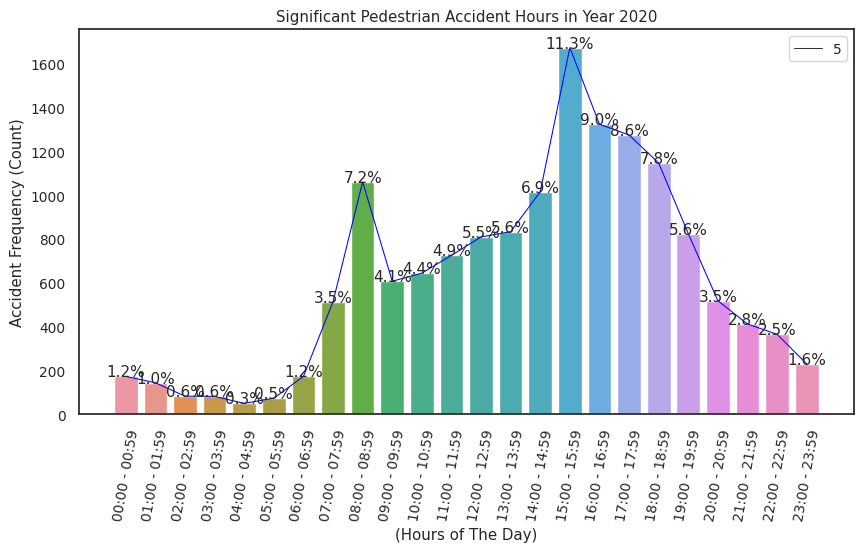

In [89]:
sns.set(font_scale=0.9)
sns.set_style("white")
plt.figure(figsize=(10,5))
plt.xticks(rotation=80)

# Bar plot
acc_pedest_hours = sns.barplot(data=acc_pedest_time, x="Time Intervals", y="Pedestrian Total Count")

# Line plot tracing the heights of the bars
sns.lineplot(data=acc_pedest_time, x="Time Intervals", y="Pedestrian Total Count", color="blue", size= 5)

# Calculate total count for percentage calculation
total = acc_pedest_time['Pedestrian Total Count'].sum()

# Adding percentage to the bars
for p in acc_pedest_hours.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width() / 2
    y = p.get_y() + p.get_height()
    acc_pedest_hours.annotate(percentage, (x, y), ha="center", size=11)

plt.title("Significant Pedestrian Accident Hours in Year 2020")
acc_pedest_hours.set(xlabel="(Hours of The Day)", ylabel="Accident Frequency (Count)")

# Save the plot
plt.savefig("Hours of Pedestrian Accident.png", dpi=2000)

### Graphical Plotting the Significant Accident Time for Pedestrian (Casaulty Class: 3)

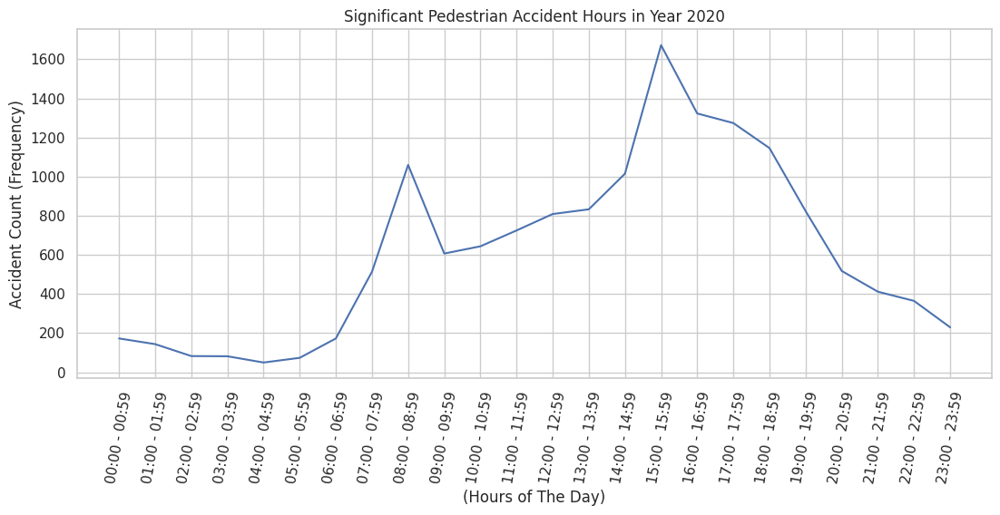

In [90]:
# ploting the time interval in hours against the frequency of occurance of accident
sns.set(font_scale= 1)
sns.set_style("whitegrid")
plt.figure(figsize=(13,5))
plt.xticks(rotation=80)


acc_pedest_hours = sns.lineplot(data=acc_pedest_time, x="Time Intervals", y="Pedestrian Total Count")

plt.title("Significant Pedestrian Accident Hours in Year 2020")
acc_pedest_hours.set(xlabel= "(Hours of The Day)", ylabel= "Accident Count (Frequency)")

plt.savefig("Hours of Pedestrian Accident Graph.png")

### Significan Days of The Week, on Which Pedestrian Accidents Occur

In [91]:
acc_pedest_day = acc_pedest["day_of_week"].value_counts().sort_index()
acc_pedest_day = pd.DataFrame({"Pedestrian Accidents Per Day Count": acc_pedest_day})

acc_pedest_day.index.names =["Days"]
acc_pedest_day.reset_index(inplace=True)


# Viewing the accident time interval data frame
acc_pedest_day

,Days,Pedestrian Accidents Per Day Count
0,1,1242
1,2,2207
2,3,2267
3,4,2247
4,5,2366
5,6,2543
6,7,1878


### Plotting the Significant Pedestrian Accident Days of The Week (in Actually days of the Week)

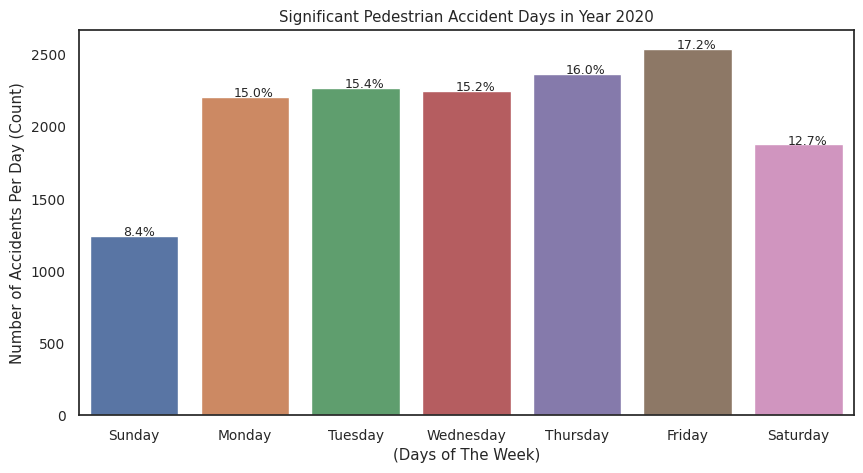

In [92]:
# ploting the time interval in hours against the frequency of occurance of accident
day_names = {
    1: "Sunday",
    2: "Monday",
    3: "Tuesday",
    4: "Wednesday",
    5: "Thursday",
    6: "Friday",
    7: "Saturday",
}

sns.set(font_scale=0.9)
sns.set_style("white")
plt.figure(figsize=(10, 5))

acc_pedest_day_plot = sns.barplot(data=acc_pedest_day, x= "Days", y= "Pedestrian Accidents Per Day Count") # plot barplot

# Convert day numbers to day names for the x-axis labels
acc_pedest_day_plot.set_xticklabels([day_names[day] for day in acc_pedest_day["Days"]])

# Calculate total count for percentage calculation
total = acc_pedest_day['Pedestrian Accidents Per Day Count'].sum()

# Adding percentage to the bars
for p in acc_pedest_day_plot.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width() / 2 - 0.1
    y = p.get_y() + p.get_height()
    acc_pedest_day_plot.annotate(percentage, (x, y), size = 9)

plt.title("Significant Pedestrian Accident Days in Year 2020")
acc_pedest_day_plot.set(xlabel= "(Days of The Week)", ylabel= "Number of Accidents Per Day (Count)")
plt.savefig("Significant Pedestrian Accident Days.png", dpi = 3000)

plt.show()

### Graphical Plotting the Significant Accident days of Week for Pedestrian (Casaulty Class: 3)

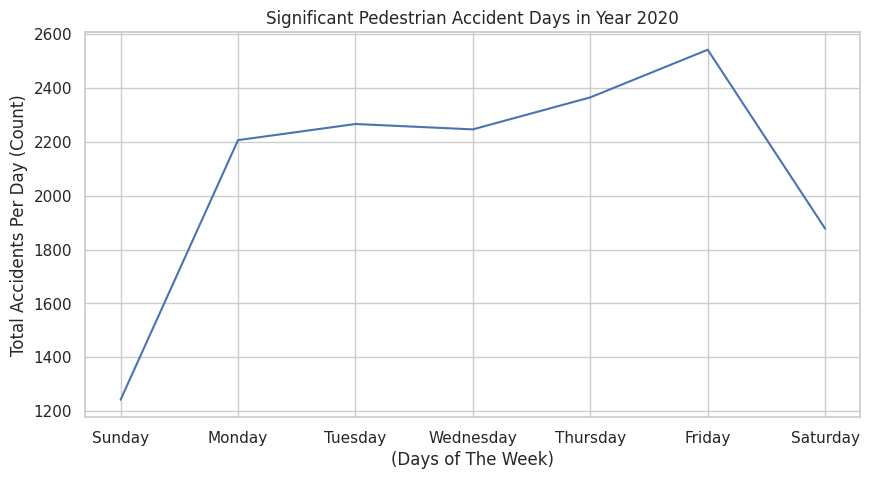

In [93]:
sns.set(font_scale=1)
sns.set_style("whitegrid")
plt.figure(figsize=(10, 5))

acc_pedest_day_plot = sns.lineplot(data=acc_pedest_day, x= "Days", y= "Pedestrian Accidents Per Day Count") # plot barplot

# Convert day numbers to day names for the x-axis labels
acc_pedest_day_plot.set_xticklabels([day_names[day] for day in acc_pedest_day["Days"]])
acc_pedest_day_plot.set_xticks(days)  # Set the x-axis ticks to be the numerical day values

plt.title("Significant Pedestrian Accident Days in Year 2020")
acc_pedest_day_plot.set(xlabel= "(Days of The Week)", ylabel= "Total Accidents Per Day (Count)")
plt.savefig("Significant Pedestrian Accident Days Graph.png")

plt.show()

## Q.4: Using the apriori algorithm, explore the impact of selected variables on accident severity

### For his analysis, all tables werer merged together ie (acc_df, veh_df,  Cas_df and lsoa_df)

In [94]:
all_df = acc_df.merge(veh_df, on="accident_index") \
               .merge(cas_df, on="accident_index") \
               .merge(lsoa_df, left_on="lsoa_of_accident_location", right_on="lsoa01cd")

In [95]:
all_df

,accident_index,accident_year_x,accident_reference_x,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,casualty_type,casualty_home_area_type,casualty_imd_decile,objectid,lsoa01cd,lsoa01nm,lsoa01nmw,shape__area,shape__length,globalid
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,1,3,1,...,0,1,4,4576,E01004576,Wandsworth 013D,Wandsworth 013D,4.456251e+05,4486.701130,c7ddebfb-d730-4be6-b67e-938adb21309e
1,2020010240428,2020,010240428,521357.0,174350.0,-0.254734,51.455133,1,2,2,...,1,1,8,4576,E01004576,Wandsworth 013D,Wandsworth 013D,4.456251e+05,4486.701130,c7ddebfb-d730-4be6-b67e-938adb21309e
2,2020010240428,2020,010240428,521357.0,174350.0,-0.254734,51.455133,1,2,2,...,1,1,8,4576,E01004576,Wandsworth 013D,Wandsworth 013D,4.456251e+05,4486.701130,c7ddebfb-d730-4be6-b67e-938adb21309e
3,2020010249713,2020,010249713,521564.0,174913.0,-0.251563,51.460148,1,3,2,...,1,1,4,4576,E01004576,Wandsworth 013D,Wandsworth 013D,4.456251e+05,4486.701130,c7ddebfb-d730-4be6-b67e-938adb21309e
4,2020010249713,2020,010249713,521564.0,174913.0,-0.251563,51.460148,1,3,2,...,1,1,4,4576,E01004576,Wandsworth 013D,Wandsworth 013D,4.456251e+05,4486.701130,c7ddebfb-d730-4be6-b67e-938adb21309e
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
201938,202063D085620,2020,63D085620,295530.0,284080.0,-3.538477,52.444677,63,2,2,...,9,1,5,32948,W01000466,Powys 010C,Powys 010C,1.747211e+06,7827.411516,f029128c-ebb5-44ba-ab93-7ddd81d59d04
201939,202063D085620,2020,63D085620,295530.0,284080.0,-3.538477,52.444677,63,2,2,...,9,1,5,32948,W01000466,Powys 010C,Powys 010C,1.747211e+06,7827.411516,f029128c-ebb5-44ba-ab93-7ddd81d59d04
201940,202063D085620,2020,63D085620,295530.0,284080.0,-3.538477,52.444677,63,2,2,...,9,1,5,32948,W01000466,Powys 010C,Powys 010C,1.747211e+06,7827.411516,f029128c-ebb5-44ba-ab93-7ddd81d59d04
201941,202063D086520,2020,63D086520,310980.0,291900.0,-3.313323,52.517700,63,2,2,...,90,1,9,32963,W01000481,Powys 008B,Powys 008B,7.044616e+06,13558.849188,2ef1558e-c2e5-44f8-8578-2f27b9d3fcdc


In [96]:
all_df.duplicated().sum()

0

In [97]:
all_df.isna().sum()

accident_index            0
accident_year_x           0
accident_reference_x      0
location_easting_osgr     0
location_northing_osgr    0
                         ..
lsoa01nm                  0
lsoa01nmw                 0
shape__area               0
shape__length             0
globalid                  0
Length: 88, dtype: int64

In [98]:
# all_df = all_df.drop_duplicates().copy() # drop all duplicated rows

## Feature Selection
#### Due to the large number of columns (variables), only the key feature are selected that could strongly impact on the accident severity are considered;
#### Accident tabel: (accident_severity, road_type, speed_limit, road_surface_condition, weather_conditions, light_condition, urban_or_rural_area)



## Meaning of the Pesudo Encoded values:
### Severity_1 - Fatal
### Severity_2 - Serious
### Severity_3 - Slight
### Road_type - 1 = Roundabout , 2 = One way street, 3 = Dual carriageway, 4 = Single carriageway , 5 = Slip road, 6 = Unknown
### weather_conditions - 1 = Fine without high winds, 2 = Raining without high winds, 3 = Snowing without high winds, 4 = Fine with high winds, 5 = Raining with high winds, 6 = Snowing with high winds, 7 = Fog or mist — if hazard, 8 = Other, 9 = Unknown
### Road_surface_conditions  - 1 = Dry, 2 = Wet/ Damp, 3 = Snow, 4 = Frost or Mist - if hazard, 5 = Flood(surafce water over 3cm deep)
### light_conditions - Daylight = 1, 4 = Darkness: street lights present and lit, 5 = Darkness: street lights present but unlit, 6 = Darkness: no street lighting, 7 = Darkness: street lighting unknown
### Urban of Rural area - 1 = Urban, 2 = Rural, 3  = Uknown

### Cehcking the different accident Severity value counts for Year 2020

In [99]:
all_df.accident_severity.unique()

array([3, 2, 1])

In [100]:
sev_1 = all_df["accident_severity"] == 1
sev_1.value_counts()

False    198271
True       3672
Name: accident_severity, dtype: int64

# Exploring where accident severity is 1 (Fatal)

In [101]:
(acc_df["accident_severity"] == 2).value_counts()

False    72844
True     18355
Name: accident_severity, dtype: int64

In [102]:
(acc_df["accident_severity"] == 3).value_counts()

True     71453
False    19746
Name: accident_severity, dtype: int64

### ploting accident the severity distribution

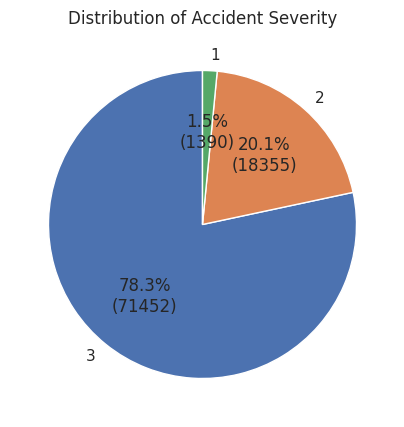

In [103]:
# Count occurrences of each unique value
value_counts = acc_df['accident_severity'].value_counts()

# Plot pie chart
plt.figure(figsize=(5, 5))

# Custom autopct to include both percentage and count
def func(pct, allvals):
    absolute = int(pct/100.*np.sum(allvals))
    return "{:.1f}%\n({:d})".format(pct, absolute)

plt.pie(value_counts, labels=value_counts.index, autopct=lambda pct: func(pct, value_counts), startangle=90)
plt.title('Distribution of Accident Severity')
plt.show()

### Selected Features (Items)

In [104]:
feature_df = all_df[["accident_severity",  "road_type", "speed_limit", "weather_conditions", "road_surface_conditions", "light_conditions","urban_or_rural_area"]]

In [105]:
# acc_sev_1f = feature_df[feature_df['accident_severity'] == 1]
# acc_sev_1f

In [106]:
feature_df

,accident_severity,road_type,speed_limit,weather_conditions,road_surface_conditions,light_conditions,urban_or_rural_area
0,3,6,20,9,9,1,1
1,2,6,30,1,2,1,1
2,2,6,30,1,2,1,1
3,3,6,60,1,1,1,1
4,3,6,60,1,1,1,1
...,...,...,...,...,...,...,...
201938,2,6,60,2,2,6,2
201939,2,6,60,2,2,6,2
201940,2,6,60,2,2,6,2
201941,2,6,30,2,2,5,1


In [107]:
feature_df.isna().sum()

accident_severity          0
road_type                  0
speed_limit                0
weather_conditions         0
road_surface_conditions    0
light_conditions           0
urban_or_rural_area        0
dtype: int64

#### checking for any special or abnoraml entries

In [108]:
feature_df.loc[~(feature_df == -1).any(axis=1)]

,accident_severity,road_type,speed_limit,weather_conditions,road_surface_conditions,light_conditions,urban_or_rural_area
0,3,6,20,9,9,1,1
1,2,6,30,1,2,1,1
2,2,6,30,1,2,1,1
3,3,6,60,1,1,1,1
4,3,6,60,1,1,1,1
...,...,...,...,...,...,...,...
201938,2,6,60,2,2,6,2
201939,2,6,60,2,2,6,2
201940,2,6,60,2,2,6,2
201941,2,6,30,2,2,5,1


### Perform One Hot Encoding on The Selected Features

In [109]:
apriori_df = pd.get_dummies(feature_df, columns= feature_df.columns)

apriori_df

,accident_severity_1,accident_severity_2,accident_severity_3,road_type_1,road_type_2,road_type_3,road_type_6,road_type_7,road_type_9,speed_limit_-1,...,road_surface_conditions_5,road_surface_conditions_9,light_conditions_-1,light_conditions_1,light_conditions_4,light_conditions_5,light_conditions_6,light_conditions_7,urban_or_rural_area_1,urban_or_rural_area_2
0,0,0,1,0,0,0,1,0,0,0,...,0,1,0,1,0,0,0,0,1,0
1,0,1,0,0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,1,0
2,0,1,0,0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,1,0
3,0,0,1,0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,1,0
4,0,0,1,0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
201938,0,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,1
201939,0,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,1
201940,0,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,1
201941,0,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,1,0


### Performing Apriori Algorithm On the One Hot Ecoded Selected Features

#### Frequnecy of Occurance

### Select Items (Features) With Highest Frequency (30% min Support)

In [110]:
freq_feat = apriori(apriori_df, min_support=0.3, use_colnames=True)
freq_feat["length"] = freq_feat["itemsets"].apply(lambda x: len(x))
freq_feat

,support,itemsets,length
0,0.782676,(accident_severity_3),1
1,0.721213,(road_type_6),1
2,0.543693,(speed_limit_30),1
3,0.781666,(weather_conditions_1),1
4,0.689135,(road_surface_conditions_1),1
...,...,...,...
71,0.304378,"(weather_conditions_1, urban_or_rural_area_1, ...",4
72,0.377087,"(weather_conditions_1, road_surface_conditions...",4
73,0.317778,"(weather_conditions_1, road_surface_conditions...",4
74,0.310598,"(weather_conditions_1, road_surface_conditions...",4


In [111]:
pd.set_option("display.max_colwidth", None)
app_highest_freq = freq_feat[(freq_feat["length"] > 2) & (freq_feat["support"]> 0.2)]
app_highest_freq

,support,itemsets,length
29,0.352476,"(speed_limit_30, accident_severity_3, road_type_6)",3
30,0.437148,"(weather_conditions_1, accident_severity_3, road_type_6)",3
31,0.386119,"(road_surface_conditions_1, accident_severity_3, road_type_6)",3
32,0.405540,"(road_type_6, accident_severity_3, light_conditions_1)",3
33,0.379246,"(urban_or_rural_area_1, accident_severity_3, road_type_6)",3
34,0.347544,"(weather_conditions_1, speed_limit_30, accident_severity_3)",3
35,0.314331,"(road_surface_conditions_1, speed_limit_30, accident_severity_3)",3
36,0.318169,"(speed_limit_30, accident_severity_3, light_conditions_1)",3
37,0.378944,"(urban_or_rural_area_1, speed_limit_30, accident_severity_3)",3
38,0.506519,"(weather_conditions_1, road_surface_conditions_1, accident_severity_3)",3


### Calculating Confidence level of the Selected Items (Features)

In [112]:
asso_rule = association_rules(freq_feat, metric = "confidence", min_threshold= 0.7)
asso_rule

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(accident_severity_3),(road_type_6),0.782676,0.721213,0.553592,0.707306,0.980717,-0.010885,0.952486,-0.082967
1,(road_type_6),(accident_severity_3),0.721213,0.782676,0.553592,0.767584,0.980717,-0.010885,0.935063,-0.065881
2,(speed_limit_30),(accident_severity_3),0.543693,0.782676,0.441823,0.812633,1.038274,0.016287,1.159880,0.080786
3,(weather_conditions_1),(accident_severity_3),0.781666,0.782676,0.608701,0.778723,0.994949,-0.003090,0.982135,-0.022723
4,(accident_severity_3),(weather_conditions_1),0.782676,0.781666,0.608701,0.777718,0.994949,-0.003090,0.982238,-0.022826
...,...,...,...,...,...,...,...,...,...,...
166,"(weather_conditions_1, road_surface_conditions_1, urban_or_rural_area_1)",(light_conditions_1),0.426506,0.711854,0.326805,0.766237,1.076396,0.023195,1.232641,0.123757
167,"(weather_conditions_1, urban_or_rural_area_1, light_conditions_1)",(road_surface_conditions_1),0.367747,0.689135,0.326805,0.888667,1.289540,0.073378,2.792220,0.355127
168,"(road_surface_conditions_1, urban_or_rural_area_1, light_conditions_1)",(weather_conditions_1),0.347128,0.781666,0.326805,0.941455,1.204421,0.055467,3.729339,0.259967
169,"(road_surface_conditions_1, urban_or_rural_area_1)","(weather_conditions_1, light_conditions_1)",0.455465,0.585507,0.326805,0.717519,1.225467,0.060127,1.467333,0.337875


### Calculating The Lift of The Selected Items (Features)

In [113]:
lift_rule = association_rules(freq_feat, metric= "lift", min_threshold = 1)
lift_rule

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(speed_limit_30),(accident_severity_3),0.543693,0.782676,0.441823,0.812633,1.038274,0.016287,1.159880,0.080786
1,(accident_severity_3),(speed_limit_30),0.782676,0.543693,0.441823,0.564502,1.038274,0.016287,1.047783,0.169624
2,(road_surface_conditions_1),(accident_severity_3),0.689135,0.782676,0.539514,0.782885,1.000267,0.000144,1.000962,0.000858
3,(accident_severity_3),(road_surface_conditions_1),0.782676,0.689135,0.539514,0.689319,1.000267,0.000144,1.000592,0.001228
4,(accident_severity_3),(light_conditions_1),0.782676,0.711854,0.563253,0.719650,1.010951,0.006101,1.027807,0.049845
...,...,...,...,...,...,...,...,...,...,...
371,"(urban_or_rural_area_1, light_conditions_1)","(weather_conditions_1, road_surface_conditions_1)",0.446641,0.648426,0.326805,0.731695,1.128419,0.037192,1.310356,0.205660
372,(weather_conditions_1),"(road_surface_conditions_1, urban_or_rural_area_1, light_conditions_1)",0.781666,0.347128,0.326805,0.418088,1.204421,0.055467,1.121943,0.777367
373,(road_surface_conditions_1),"(weather_conditions_1, urban_or_rural_area_1, light_conditions_1)",0.689135,0.367747,0.326805,0.474225,1.289540,0.073378,1.202516,0.722275
374,(urban_or_rural_area_1),"(weather_conditions_1, road_surface_conditions_1, light_conditions_1)",0.639418,0.508683,0.326805,0.511098,1.004747,0.001544,1.004939,0.013102


In [114]:
lift_rule["antecedent_len"] = lift_rule["antecedents"].apply(lambda x: len(x))

#### Extracting the antecedent_len >= 2

In [115]:
lift_rule[lift_rule ["antecedent_len"]>=2]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric,antecedent_len
34,"(speed_limit_30, accident_severity_3)",(road_type_6),0.441823,0.721213,0.352476,0.797776,1.106159,0.033827,1.378605,0.171935,2
35,"(speed_limit_30, road_type_6)",(accident_severity_3),0.440154,0.782676,0.352476,0.800801,1.023157,0.007978,1.090988,0.040428,2
36,"(accident_severity_3, road_type_6)",(speed_limit_30),0.553592,0.543693,0.352476,0.636707,1.171078,0.051492,1.256030,0.327247,2
40,"(accident_severity_3, road_type_6)",(weather_conditions_1),0.553592,0.781666,0.437148,0.789658,1.010224,0.004424,1.037994,0.022671,2
42,"(accident_severity_3, road_type_6)",(road_surface_conditions_1),0.553592,0.689135,0.386119,0.697479,1.012108,0.004619,1.027582,0.026799,2
...,...,...,...,...,...,...,...,...,...,...,...
367,"(weather_conditions_1, urban_or_rural_area_1)","(road_surface_conditions_1, light_conditions_1)",0.500750,0.537394,0.326805,0.652631,1.214436,0.057705,1.331742,0.353676,2
368,"(weather_conditions_1, light_conditions_1)","(road_surface_conditions_1, urban_or_rural_area_1)",0.585507,0.455465,0.326805,0.558158,1.225467,0.060127,1.232419,0.443879,2
369,"(road_surface_conditions_1, urban_or_rural_area_1)","(weather_conditions_1, light_conditions_1)",0.455465,0.585507,0.326805,0.717519,1.225467,0.060127,1.467333,0.337875,2
370,"(road_surface_conditions_1, light_conditions_1)","(weather_conditions_1, urban_or_rural_area_1)",0.537394,0.500750,0.326805,0.608129,1.214436,0.057705,1.274016,0.381691,2


### Extracting the accident Severity as consiquence, with min_threshold of 2 anticident, based on the Decending order of lift values

In [116]:
#### Extracting the consequence for accident_severity_3
sev_3 = lift_rule[(lift_rule ["consequents"]=={"accident_severity_3"}) & (lift_rule ["antecedent_len"]>=2)]
sev_3_sorted = sev_3.sort_values(by="lift", ascending=False)
sev_3_sorted.head(7)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric,antecedent_len
102,"(urban_or_rural_area_1, light_conditions_1)",(accident_severity_3),0.446641,0.782676,0.371550,0.831877,1.062862,0.021975,1.292649,0.106883,2
309,"(weather_conditions_1, urban_or_rural_area_1, light_conditions_1)",(accident_severity_3),0.367747,0.782676,0.304378,0.827682,1.057503,0.016551,1.261181,0.086004,3
65,"(speed_limit_30, light_conditions_1)",(accident_severity_3),0.386748,0.782676,0.318169,0.822678,1.051109,0.015471,1.225590,0.079289,2
96,"(road_surface_conditions_1, urban_or_rural_area_1)",(accident_severity_3),0.455465,0.782676,0.374274,0.821740,1.049910,0.017792,1.219139,0.087300,2
294,"(weather_conditions_1, road_surface_conditions_1, urban_or_rural_area_1)",(accident_severity_3),0.426506,0.782676,0.349747,0.820028,1.047723,0.015931,1.207541,0.079424,3
70,"(urban_or_rural_area_1, speed_limit_30)",(accident_severity_3),0.462938,0.782676,0.378944,0.818563,1.045851,0.016613,1.197792,0.081631,2
86,"(weather_conditions_1, urban_or_rural_area_1)",(accident_severity_3),0.500750,0.782676,0.409809,0.818389,1.045630,0.017883,1.196647,0.087408,2


### Extracting on the "antecedents", "consequents", "support", "confidence", "lift"

In [117]:
sev_3_sorted[["antecedents", "consequents", "support", "confidence", "lift"]].head(7)

,antecedents,consequents,support,confidence,lift
102,"(urban_or_rural_area_1, light_conditions_1)",(accident_severity_3),0.371550,0.831877,1.062862
309,"(weather_conditions_1, urban_or_rural_area_1, light_conditions_1)",(accident_severity_3),0.304378,0.827682,1.057503
65,"(speed_limit_30, light_conditions_1)",(accident_severity_3),0.318169,0.822678,1.051109
96,"(road_surface_conditions_1, urban_or_rural_area_1)",(accident_severity_3),0.374274,0.821740,1.049910
294,"(weather_conditions_1, road_surface_conditions_1, urban_or_rural_area_1)",(accident_severity_3),0.349747,0.820028,1.047723
70,"(urban_or_rural_area_1, speed_limit_30)",(accident_severity_3),0.378944,0.818563,1.045851
86,"(weather_conditions_1, urban_or_rural_area_1)",(accident_severity_3),0.409809,0.818389,1.045630


## sortig the desending order of the lift value

In [118]:
# Select the desired columns and top 7 rows
top_sev_3 = sev_3_sorted[["antecedents", "consequents", "support", "confidence", "lift"]].head(7)

# Round numerical values to 3 decimal places
columns_to_round = ["support", "confidence", "lift"]
top_sev_3[columns_to_round] = top_sev_3[columns_to_round].round(3)

# Reset index and set it to start from 1
top_sev_3.index = range(1, len(top_sev_3) + 1)

top_sev_3

,antecedents,consequents,support,confidence,lift
1,"(urban_or_rural_area_1, light_conditions_1)",(accident_severity_3),0.372,0.832,1.063
2,"(weather_conditions_1, urban_or_rural_area_1, light_conditions_1)",(accident_severity_3),0.304,0.828,1.058
3,"(speed_limit_30, light_conditions_1)",(accident_severity_3),0.318,0.823,1.051
4,"(road_surface_conditions_1, urban_or_rural_area_1)",(accident_severity_3),0.374,0.822,1.050
5,"(weather_conditions_1, road_surface_conditions_1, urban_or_rural_area_1)",(accident_severity_3),0.350,0.820,1.048
6,"(urban_or_rural_area_1, speed_limit_30)",(accident_severity_3),0.379,0.819,1.046
7,"(weather_conditions_1, urban_or_rural_area_1)",(accident_severity_3),0.410,0.818,1.046


In [119]:
#### Extracting the consequence for accident_severity_2

sev_2 = lift_rule[lift_rule ["consequents"]=={"accident_severity_2"}]
sev_2

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric,antecedent_len


In [120]:
#### Extracting the consequence for accident_severity_1

lift_rule[lift_rule ["consequents"]=={"accident_severity_1"}]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric,antecedent_len


## Q.5: Identify accidents in region: Identify accidents in our region: Kingston upon Hull, Humberside, and the East Riding of Yorkshire etc. You can do this by filtering on LSOA, or police region or another method if you can find one. Run clustering on this data. What do these clusters reveal about the distribution of accidents in our region?

### Extracting the data for humerside using police force 16 which represents humberside region

In [121]:
humber_df = all_df.loc[(all_df["police_force"] == 16 )]
humber_df

,accident_index,accident_year_x,accident_reference_x,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,casualty_type,casualty_home_area_type,casualty_imd_decile,objectid,lsoa01cd,lsoa01nm,lsoa01nmw,shape__area,shape__length,globalid
83493,2020160914930,2020,160914930,506050.0,428813.0,-0.393424,53.744936,16,3,2,...,9,3,6,12777,E01012777,Kingston upon Hull 028E,Kingston upon Hull 028E,3.567509e+05,3963.099631,4c068a55-c2d9-426c-9cfa-94742ef4a3ff
83494,2020160914930,2020,160914930,506050.0,428813.0,-0.393424,53.744936,16,3,2,...,9,3,6,12777,E01012777,Kingston upon Hull 028E,Kingston upon Hull 028E,3.567509e+05,3963.099631,4c068a55-c2d9-426c-9cfa-94742ef4a3ff
83495,2020160918418,2020,160918418,505576.0,428756.0,-0.400627,53.744520,16,3,2,...,1,1,5,12777,E01012777,Kingston upon Hull 028E,Kingston upon Hull 028E,3.567509e+05,3963.099631,4c068a55-c2d9-426c-9cfa-94742ef4a3ff
83496,2020160918418,2020,160918418,505576.0,428756.0,-0.400627,53.744520,16,3,2,...,1,1,5,12777,E01012777,Kingston upon Hull 028E,Kingston upon Hull 028E,3.567509e+05,3963.099631,4c068a55-c2d9-426c-9cfa-94742ef4a3ff
83497,2020160936879,2020,160936879,505583.0,428752.0,-0.400523,53.744482,16,3,2,...,1,1,10,12777,E01012777,Kingston upon Hull 028E,Kingston upon Hull 028E,3.567509e+05,3963.099631,4c068a55-c2d9-426c-9cfa-94742ef4a3ff
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87473,2020161012614,2020,161012614,504795.0,439763.0,-0.408728,53.843568,16,3,5,...,9,1,3,13037,E01013037,East Riding of Yorkshire 019B,East Riding of Yorkshire 019B,2.577429e+06,11349.306536,e3117ff6-de67-45f4-8ccd-9608fbacd93e
87474,2020161012614,2020,161012614,504795.0,439763.0,-0.408728,53.843568,16,3,5,...,9,1,3,13037,E01013037,East Riding of Yorkshire 019B,East Riding of Yorkshire 019B,2.577429e+06,11349.306536,e3117ff6-de67-45f4-8ccd-9608fbacd93e
87475,2020161012614,2020,161012614,504795.0,439763.0,-0.408728,53.843568,16,3,5,...,9,1,3,13037,E01013037,East Riding of Yorkshire 019B,East Riding of Yorkshire 019B,2.577429e+06,11349.306536,e3117ff6-de67-45f4-8ccd-9608fbacd93e
87476,2020161012744,2020,161012744,503718.0,428641.0,-0.428826,53.743858,16,3,2,...,1,1,5,13107,E01013107,East Riding of Yorkshire 034E,East Riding of Yorkshire 034E,7.226835e+05,5478.942896,98f2a23f-8a71-4af2-a948-a3c9c22a896a


## Secondary Data Cleaning before performing Clustering

In [122]:
pd.set_option("display.max_colwidth", None)
humber_df.isna().sum()

accident_index            0
accident_year_x           0
accident_reference_x      0
location_easting_osgr     0
location_northing_osgr    0
                         ..
lsoa01nm                  0
lsoa01nmw                 0
shape__area               0
shape__length             0
globalid                  0
Length: 88, dtype: int64

In [123]:
humber_df[humber_df.isin([-1]).any(axis=1)]

,accident_index,accident_year_x,accident_reference_x,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,casualty_type,casualty_home_area_type,casualty_imd_decile,objectid,lsoa01cd,lsoa01nm,lsoa01nmw,shape__area,shape__length,globalid
83496,2020160918418,2020,160918418,505576.0,428756.0,-0.400627,53.744520,16,3,2,...,1,1,5,12777,E01012777,Kingston upon Hull 028E,Kingston upon Hull 028E,3.567509e+05,3963.099631,4c068a55-c2d9-426c-9cfa-94742ef4a3ff
83498,2020160936879,2020,160936879,505583.0,428752.0,-0.400523,53.744482,16,3,2,...,1,1,10,12777,E01012777,Kingston upon Hull 028E,Kingston upon Hull 028E,3.567509e+05,3963.099631,4c068a55-c2d9-426c-9cfa-94742ef4a3ff
83499,2020160947046,2020,160947046,506031.0,428789.0,-0.393720,53.744724,16,3,1,...,0,-1,-1,12777,E01012777,Kingston upon Hull 028E,Kingston upon Hull 028E,3.567509e+05,3963.099631,4c068a55-c2d9-426c-9cfa-94742ef4a3ff
83500,2020160951627,2020,160951627,505692.0,428758.0,-0.398868,53.744514,16,2,2,...,1,1,9,12777,E01012777,Kingston upon Hull 028E,Kingston upon Hull 028E,3.567509e+05,3963.099631,4c068a55-c2d9-426c-9cfa-94742ef4a3ff
83501,2020160951627,2020,160951627,505692.0,428758.0,-0.398868,53.744514,16,2,2,...,1,1,9,12777,E01012777,Kingston upon Hull 028E,Kingston upon Hull 028E,3.567509e+05,3963.099631,4c068a55-c2d9-426c-9cfa-94742ef4a3ff
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87473,2020161012614,2020,161012614,504795.0,439763.0,-0.408728,53.843568,16,3,5,...,9,1,3,13037,E01013037,East Riding of Yorkshire 019B,East Riding of Yorkshire 019B,2.577429e+06,11349.306536,e3117ff6-de67-45f4-8ccd-9608fbacd93e
87474,2020161012614,2020,161012614,504795.0,439763.0,-0.408728,53.843568,16,3,5,...,9,1,3,13037,E01013037,East Riding of Yorkshire 019B,East Riding of Yorkshire 019B,2.577429e+06,11349.306536,e3117ff6-de67-45f4-8ccd-9608fbacd93e
87475,2020161012614,2020,161012614,504795.0,439763.0,-0.408728,53.843568,16,3,5,...,9,1,3,13037,E01013037,East Riding of Yorkshire 019B,East Riding of Yorkshire 019B,2.577429e+06,11349.306536,e3117ff6-de67-45f4-8ccd-9608fbacd93e
87476,2020161012744,2020,161012744,503718.0,428641.0,-0.428826,53.743858,16,3,2,...,1,1,5,13107,E01013107,East Riding of Yorkshire 034E,East Riding of Yorkshire 034E,7.226835e+05,5478.942896,98f2a23f-8a71-4af2-a948-a3c9c22a896a


In [124]:
# Calculating the number of -1 in each column
counts = (humber_df == -1).sum(axis=0)

# Select only column with more than 10 numbere of -1
coln_above_10 = counts[counts > 10].index.tolist()

print("Column with more than 10 numbewr of -1")
print(coln_above_10)

Column with more than 10 numbewr of -1
['junction_control', 'second_road_number', 'age_of_driver', 'age_band_of_driver', 'engine_capacity_cc', 'propulsion_code', 'age_of_vehicle', 'driver_imd_decile', 'driver_home_area_type', 'age_of_casualty', 'age_band_of_casualty', 'casualty_home_area_type', 'casualty_imd_decile']


# Performing Clustering

## Using KMeans Cluster Method
### Using only longitude and Latitude

In [125]:
# Using only longitude, latitude columns and converting to numply array
humber_clust_df = humber_df[["longitude", "latitude"]].to_numpy()

In [126]:
humber_clust_df

array([[-0.393424, 53.744936],
       [-0.393424, 53.744936],
       [-0.400627, 53.74452 ],
       ...,
       [-0.408728, 53.843568],
       [-0.428826, 53.743858],
       [-0.428826, 53.743858]])

## Using Elbow Method to Find the Optimun Number of Clusters

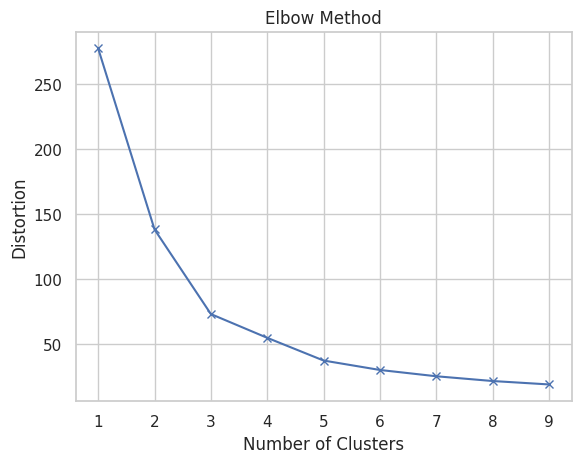

In [127]:
distort = []
K = range(1, 10)
for k in K:
  kmeans = KMeans(n_clusters=k, random_state= 42, n_init=10)
  kmeans.fit(humber_clust_df)
  distort.append(kmeans.inertia_)

plt.plot(K, distort, "bx-")
plt.xlabel("Number of Clusters")
plt.ylabel("Distortion")
plt.title("Elbow Method")
plt.show()

### Using 5 clusters

In [128]:
humber_clust = KMeans(n_clusters=5, random_state=42)
labels = humber_clust.fit_predict(humber_clust_df)
centroids = humber_clust.cluster_centers_

In [129]:
labels

array([0, 0, 0, ..., 0, 0, 0], dtype=int32)

In [130]:
centroids

array([[-0.36216483, 53.75920259],
       [-0.64480708, 53.58344785],
       [-0.08914657, 53.57574388],
       [-0.81096243, 53.81133825],
       [-0.27041002, 54.0372802 ]])

## Ploting the number of clusters distribution of accident Location

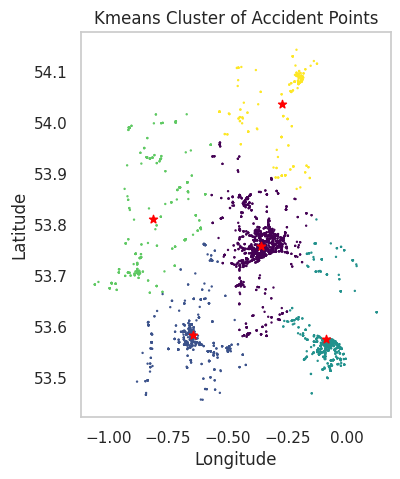

In [131]:
fig = plt.figure(figsize = (4,5))

# here we add the [:,0], [:,1] infront of the array to get our x and y datapoint for plotting
plt.scatter(humber_clust_df[:,0], humber_clust_df[:,1], s=0.5, c=labels, cmap="viridis")

plt.scatter(centroids[:,0],centroids[:,1], color='red', marker = "*")

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Kmeans Cluster of Accident Points")

plt.grid(False)
plt.show()

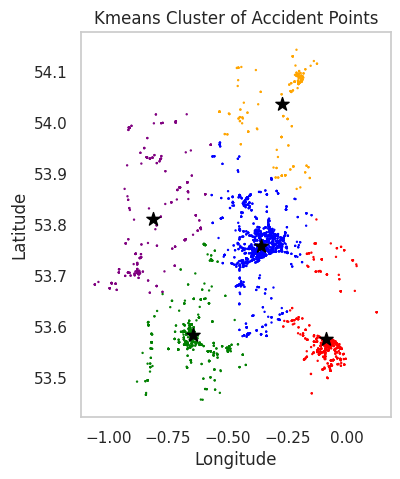

In [132]:
import matplotlib.colors as mcolors
# Create a custom colormap
colors = ["blue", "green", "red", "purple", "orange"]
cmap = mcolors.LinearSegmentedColormap.from_list("custom", colors, len(colors))

fig = plt.figure(figsize = (4, 5))

# here we add the [:,0], [:,1] in front of the array to get our x and y datapoint for plotting
# Using cmap for the clusters
plt.scatter(humber_clust_df[:, 0], humber_clust_df[:, 1], s=0.5, c=labels, cmap=cmap)

# Centroids are plotted in red
plt.scatter(centroids[:, 0], centroids[:, 1], color='black', marker="*", s=100)

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Kmeans Cluster of Accident Points")

plt.grid(False)
plt.show()

In [133]:
kmeans_silhouette = silhouette_score(humber_clust_df, labels)
kmeans_silhouette

0.6114114914914883

## Making a PLot of Kmeans on the live map of Huberisde
### Plotting the map of Humberside with the accident distribution by locations in Potrtiate mode

In [134]:
# Define a color mapping based on cluster label
color_map = {
    0: 'blue',
    1: 'green',
    2: 'red',
    3: 'purple',
    4: 'orange'
}

# Calculate the center of your data points (assuming humber_clust_df is a numpy array)
avg_latitude = humber_clust_df[:, 1].mean()
avg_longitude = humber_clust_df[:, 0].mean()

# Create a base map
humber_map = folium.Map(location=[avg_latitude, avg_longitude], zoom_start=15)

In [135]:
# Add the cluster points to the map
for lat, lon, label in zip(humber_clust_df[:, 1], humber_clust_df[:, 0], labels):
    folium.CircleMarker(
        location=[lat, lon],
        radius=0.1,
        color=color_map[label],
        fill=True,
        fill_color=color_map[label],
        fill_opacity=0.5
    ).add_to(humber_map)

# Add the centroids to the map
for lat, lon in zip(centroids[:, 1], centroids[:, 0]):
    folium.Marker(
        location=[lat, lon],
        icon=folium.Icon(color="red", icon="star")
    ).add_to(humber_map)

In [136]:
humber_map

## Perforning further Clustering with Kmeans on Weather Condition and Speed Limit

In [137]:
humber_we_sp = humber_df[["weather_conditions", "speed_limit"]]
humber_we_sp

,weather_conditions,speed_limit
83493,1,30
83494,1,30
83495,1,30
83496,1,30
83497,1,30
...,...,...
87473,1,30
87474,1,30
87475,1,30
87476,1,30


In [138]:
humber_we_sp.isna().sum()

weather_conditions    0
speed_limit           0
dtype: int64

In [139]:
humber_we_sp = humber_we_sp.to_numpy()
humber_we_sp

array([[ 1, 30],
       [ 1, 30],
       [ 1, 30],
       ...,
       [ 1, 30],
       [ 1, 30],
       [ 1, 30]])

### Using 6 clusters

In [140]:
humber_we_sp_cluster = KMeans(n_clusters=6, random_state=42) # clustering using 6 cluster
labels2 = humber_we_sp_cluster.fit_predict(humber_we_sp)
centroids2 = humber_we_sp_cluster.cluster_centers_

In [141]:
centroids2

array([[ 1.37924071, 30.        ],
       [ 1.40069085, 60.        ],
       [ 1.54731458, 40.        ],
       [ 1.32105263, 70.        ],
       [ 1.75301205, 20.        ],
       [ 1.54098361, 50.        ]])

In [142]:
labels2

array([0, 0, 0, ..., 0, 0, 0], dtype=int32)

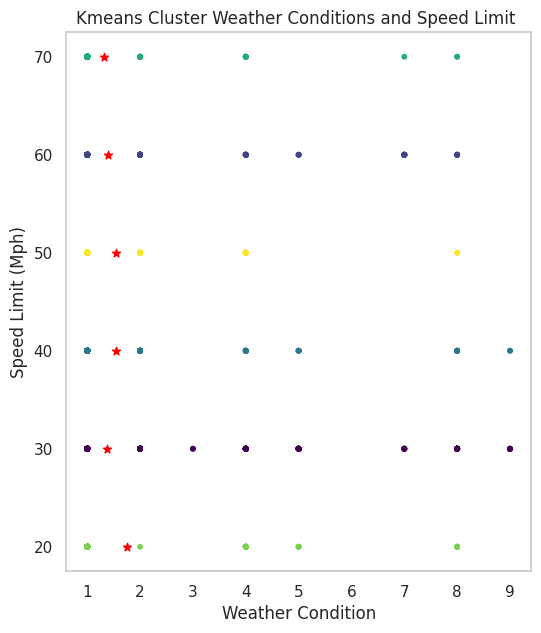

In [143]:
fig = plt.figure(figsize = (6,7))

# here we add the [:,0], [:,1] infront of the array to get our x and y datapoint for plotting
plt.scatter(humber_we_sp[:,0], humber_we_sp[:,1], s=10, c=labels2, cmap="viridis")

plt.scatter(centroids2[:,0],centroids2[:,1], color='red', marker = "*")

plt.xlabel("Weather Condition")
plt.ylabel("Speed Limit (Mph)")
plt.title("Kmeans Cluster Weather Conditions and Speed Limit ")

plt.grid(False)
plt.show()

### Using 12 Clusters to check for more clusters relationships

In [144]:
humber_we_sp_cluster12 = KMeans(n_clusters=12, random_state=42) # clustering using 6 cluster
labels12 = humber_we_sp_cluster12.fit_predict(humber_we_sp)
centroids12 = humber_we_sp_cluster12.cluster_centers_

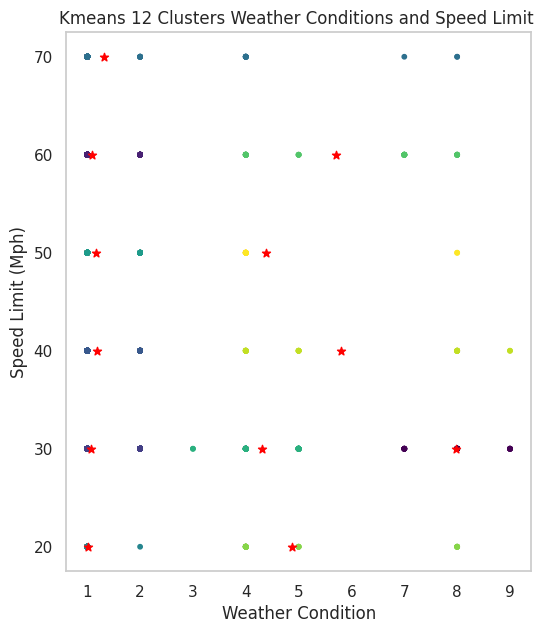

In [145]:
fig = plt.figure(figsize = (6,7))

# here we add the [:,0], [:,1] infront of the array to get our x and y datapoint for plotting
plt.scatter(humber_we_sp[:,0], humber_we_sp[:,1], s=10, c=labels12, cmap="viridis")

plt.scatter(centroids12[:,0],centroids12[:,1], color='red', marker = "*")

plt.xlabel("Weather Condition")
plt.ylabel("Speed Limit (Mph)")
plt.title("Kmeans 12 Clusters Weather Conditions and Speed Limit ")

plt.grid(False)
plt.show()

## Using KMedoids to Cluster with 5 Clusters (Using Longitude and Latitude)

In [146]:
humber_clust_df

array([[-0.393424, 53.744936],
       [-0.393424, 53.744936],
       [-0.400627, 53.74452 ],
       ...,
       [-0.408728, 53.843568],
       [-0.428826, 53.743858],
       [-0.428826, 53.743858]])

In [147]:
humber_kmedoid = KMedoids(n_clusters=5, random_state = 42)
label_kmediod = humber_kmedoid.fit_predict(humber_clust_df)
kmedoids_centroids_h = humber_kmedoid.cluster_centers_

In [148]:
kmedoids_silhouette = silhouette_score(humber_clust_df, label_kmediod)
kmedoids_silhouette

0.3833803874668709

In [149]:
label_kmediod

array([1, 1, 1, ..., 1, 1, 1])

### Ploting the Clusters for Kmedoids

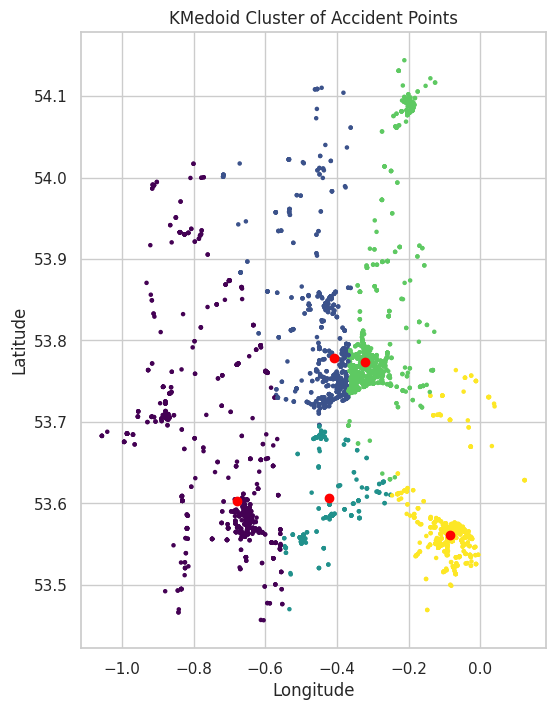

In [150]:
fig = plt.figure(figsize = (6,8))
# here we add the [:,0], [:,1] infront of the array to get our x and y datapoint for plotting
plt.scatter(humber_clust_df[:,0], humber_clust_df[:,1], s=5, c=label_kmediod, cmap="viridis")

plt.scatter(kmedoids_centroids_h[:,0],kmedoids_centroids_h[:,1], color='red')

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("KMedoid Cluster of Accident Points")
plt.show()

## Using DBSCAN CLUSTERING (Uing Longitude and Latitude)

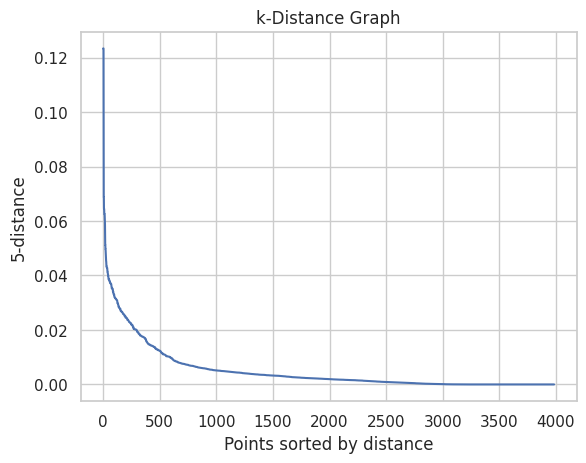

In [151]:
### Defining the optimum value of the epsilon


k=5
NN = NearestNeighbors(n_neighbors=k+1)
nbrs = NN.fit(humber_clust_df)
distances, indices = nbrs.kneighbors(humber_clust_df)

# Plotting the epsilon values
sorted_distances = np.sort(distances[:, k], axis=0)[::-1]
plt.plot(range(len(sorted_distances)), sorted_distances)
plt.rcParams["figure.figsize"] = (5,3)
plt.xlabel("Points sorted by distance")
plt.ylabel(f"{k}-distance")
plt.title("k-Distance Graph")
plt.show()

[0 0 0 ... 3 0 0]


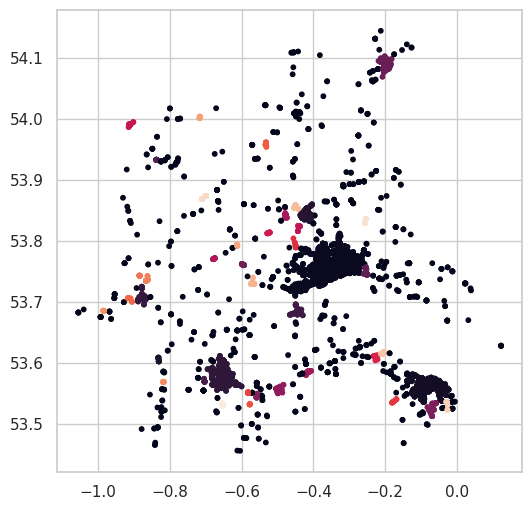

In [152]:
dbscan_opt = DBSCAN(eps=0.01, min_samples=10).fit(humber_clust_df)
labels_db = dbscan_opt.labels_


print(labels_db)

# Plotting the clusters
fig = plt.figure(figsize = (6,6))
colmap = {"viridis"}
plt.scatter(humber_clust_df[:,0], humber_clust_df[:,1], c= labels_db, s=10)


# Clustering Evaluation Matric on Longitude and Latitude (KMeans, Kmediod and DBSCAN)

### Using there Silhouette Score

In [153]:
# Compute silhouette scores
kmeans_silhouette = silhouette_score(humber_clust_df, labels)
kmedoids_silhouette = silhouette_score(humber_clust_df, label_kmediod)
dbscan_silhouette = silhouette_score(humber_clust_df, labels_db)

# Print each score on a different line
print("K-Means Silhouette Score:", kmeans_silhouette)
print("K-Medoids Silhouette Score:", kmedoids_silhouette)
print("DBSCAN Silhouette Score:", dbscan_silhouette)

K-Means Silhouette Score: 0.6114114914914883
K-Medoids Silhouette Score: 0.3833803874668709
DBSCAN Silhouette Score: 0.0722402535545542


## Q.6: Using outlier detection methods, identify unusual entries in your data set. Should you keep these entries in your data?

## Checking Potential Outlier in True Numeric Values In accident and Vehicle table

In [188]:
acc_num = acc_df.select_dtypes(include = "number")

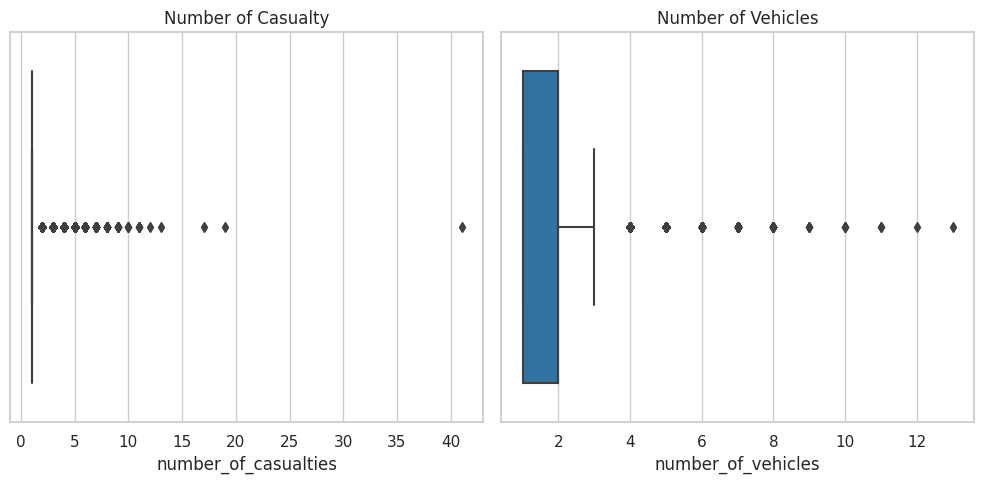

In [189]:
fig, ([ax1, ax2]) = plt.subplots(1,2, figsize=(10,5), tight_layout=True)
sns.boxplot(data=acc_num, x='number_of_casualties', palette='tab10',ax=ax1).set(title='Number of Casualty')
sns.boxplot(data=acc_num, x='number_of_vehicles', palette='tab10', ax=ax2).set(title='Number of Vehicles')
sns.set(style="whitegrid")

In [191]:
veh_num = veh_df.select_dtypes(include = "number")

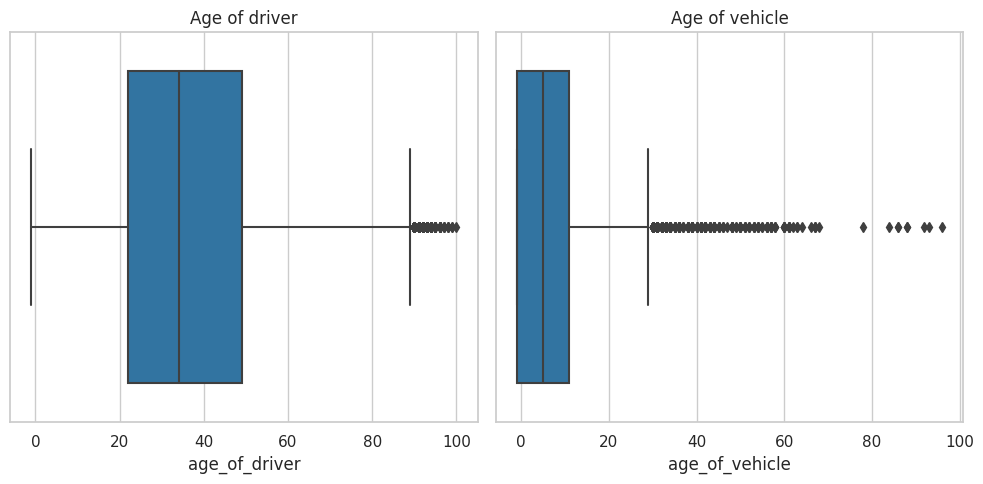

In [192]:
fig, ([ax1, ax2]) = plt.subplots(1,2, figsize=(10,5), tight_layout=True)
sns.boxplot(data=veh_num, x='age_of_driver', palette='tab10',ax=ax1).set(title='Age of driver')
sns.boxplot(data=veh_num, x='age_of_vehicle', palette='tab10', ax=ax2).set(title='Age of vehicle')
sns.set(style="whitegrid")

## Using the same longitude and Latitude for Entire Data Set (United Kingdom)

## Using LocalOutlierFactor

In [154]:
long_lat_outlier = all_df[["longitude", "latitude"]]
long_lat_outlier.head()

,longitude,latitude
0,-0.254001,51.462262
1,-0.254734,51.455133
2,-0.254734,51.455133
3,-0.251563,51.460148
4,-0.251563,51.460148


In [155]:
long_lat_outlier = long_lat_outlier.dropna(axis = 0)

In [156]:
long_lat_outlier.isna().sum()


longitude    0
latitude     0
dtype: int64

In [157]:
model = LocalOutlierFactor(n_neighbors = 30, contamination = 0.0025)
y_pred = model.fit_predict(long_lat_outlier)


In [158]:
LOF_Scores = model.negative_outlier_factor_
LOF_pred = pd.Series(y_pred, index = long_lat_outlier.index).replace([-1,1], [1,0])
long_lat_outlier["LOF_Outlier"] = LOF_pred
LOF_anomalies = long_lat_outlier[LOF_pred==1]

## To best understand if the entries of the location are accually out liers, their urban and rural area values are used to inorder to indentify if it corresponds to correct postion in the actual map. The urban area is denoted by 1 while rural area is 2

In [159]:
long_lat_outlier["urban_or_rural_area"] = all_df["urban_or_rural_area"]
outlier_URA = long_lat_outlier[["longitude", "latitude","urban_or_rural_area","LOF_Outlier" ]]
mismatch1 = outlier_URA[(outlier_URA["LOF_Outlier"]==1) &  (outlier_URA["urban_or_rural_area"]==1)]

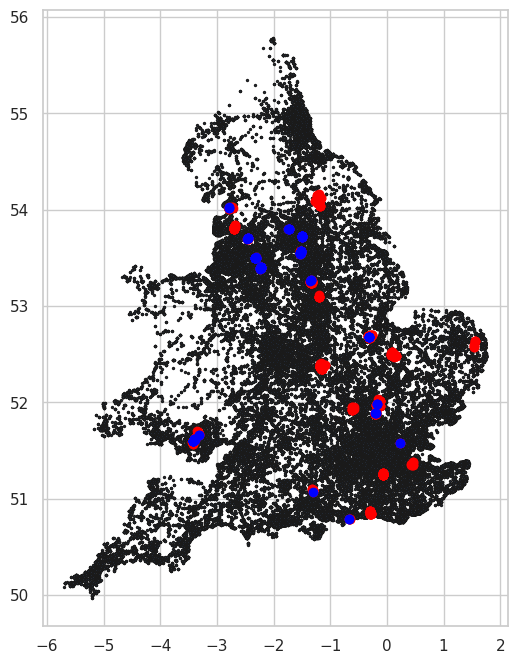

In [160]:
plt.figure(figsize=(6,8))
plt.scatter(long_lat_outlier["longitude"], long_lat_outlier["latitude"], s=2,edgecolor="k" )
plt.scatter(LOF_anomalies["longitude"], LOF_anomalies["latitude"], c="red")
plt.scatter(mismatch1["longitude"], mismatch1["latitude"], c="blue")

## Using the Isolation Forest

### Isolation Forest Uses Only Numbers in its Analysis

In [161]:
long_lat_outlier_IF = all_df.select_dtypes(include=np.number)

In [162]:
long_lat_outlier_IF.isna().sum()

accident_year_x            0
location_easting_osgr      0
location_northing_osgr     0
longitude                  0
latitude                   0
                          ..
casualty_home_area_type    0
casualty_imd_decile        0
objectid                   0
shape__area                0
shape__length              0
Length: 74, dtype: int64

In [163]:
# Defining the random sample question
ranst = np.random.RandomState(0)

# Building the outlier Detection model
model = IsolationForest(max_samples = 100, random_state=ranst,contamination=0.01)
model.fit(long_lat_outlier_IF)
if_scores = model.decision_function(long_lat_outlier_IF)
if_anomalies = model.predict(long_lat_outlier_IF)
if_anomalies = pd.Series(if_anomalies, index = long_lat_outlier_IF.index).replace([-1,1],[1,0])
long_lat_outlier_IF['IF_Outliers'] = if_anomalies
if_anomalies = long_lat_outlier_IF[if_anomalies==1]
if_anomalies

,accident_year_x,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,day_of_week,...,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,objectid,shape__area,shape__length,IF_Outliers
49,2020,526981.0,182982.0,-0.170729,51.531477,1,3,3,2,7,...,9,0,0,9,1,1,4726,1.857269e+05,2698.692831,1
57,2020,538973.0,184458.0,0.002631,51.541919,1,3,1,1,7,...,0,0,0,0,-1,-1,3617,2.326906e+05,3013.438191,1
69,2020,529121.0,181818.0,-0.140321,51.520532,1,3,1,1,2,...,0,0,0,0,1,6,4763,2.936638e+05,4706.823542,1
74,2020,529475.0,181242.0,-0.135433,51.515274,1,3,2,1,5,...,0,0,0,3,1,1,4763,2.936638e+05,4706.823542,1
75,2020,529654.0,181157.0,-0.132886,51.514469,1,3,1,1,7,...,0,0,0,0,1,10,4763,2.936638e+05,4706.823542,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
201889,2020,324280.0,259980.0,-3.110141,52.232798,63,1,4,6,7,...,2,0,0,9,3,7,32966,1.535530e+08,81092.977857,1
201890,2020,324280.0,259980.0,-3.110141,52.232798,63,1,4,6,7,...,0,0,0,9,3,6,32966,1.535530e+08,81092.977857,1
201895,2020,324280.0,259980.0,-3.110141,52.232798,63,1,4,6,7,...,2,0,0,9,3,7,32966,1.535530e+08,81092.977857,1
201896,2020,324280.0,259980.0,-3.110141,52.232798,63,1,4,6,7,...,0,0,0,9,3,6,32966,1.535530e+08,81092.977857,1


In [164]:

# """
# To better understand if we there are outlies that we should drop, we can match the match the locations where the column
# "urban_or_rural_area"== 1 and the IF_Outliers ==1. If we superimpose this locations on the plot of the outlier detection
# and If there are still outliers within the densily located accident location, thi will be considered an outlier because its
# "urban_or_rural_area" 2 and represents rural area. This can be changed to 1 but we should not drop it because its actually a
# real accident location

# """
outlier_URA_IF = long_lat_outlier_IF[["longitude", "latitude","urban_or_rural_area","IF_Outliers" ]]
outlier_URA_IF[outlier_URA_IF["IF_Outliers"]==1].value_counts().sum()
mismatch2 = outlier_URA_IF[(outlier_URA_IF["IF_Outliers"]==1) &  (outlier_URA_IF["urban_or_rural_area"]==1)]

In [165]:
mismatch = outlier_URA_IF[(outlier_URA_IF["IF_Outliers"]==1)]
mismatch

,longitude,latitude,urban_or_rural_area,IF_Outliers
49,-0.170729,51.531477,1,1
57,0.002631,51.541919,1,1
69,-0.140321,51.520532,1,1
74,-0.135433,51.515274,1,1
75,-0.132886,51.514469,1,1
...,...,...,...,...
201889,-3.110141,52.232798,2,1
201890,-3.110141,52.232798,2,1
201895,-3.110141,52.232798,2,1
201896,-3.110141,52.232798,2,1


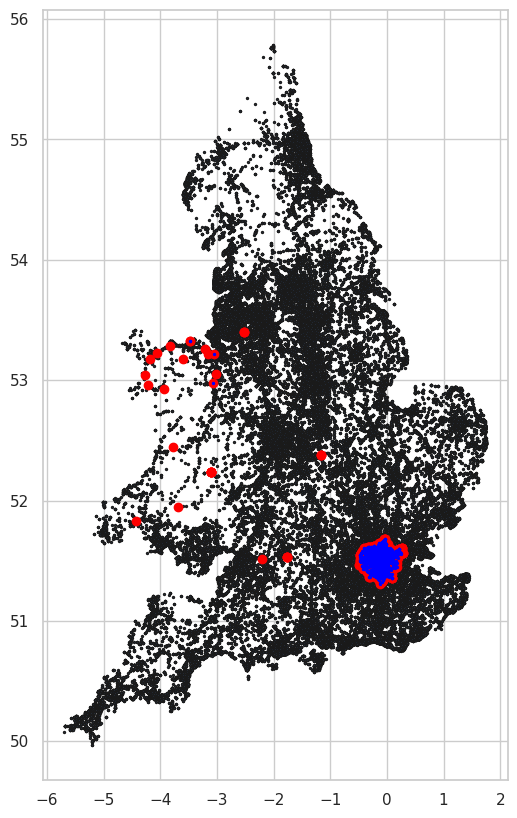

In [166]:
# Plotting the outlier detection
plt.figure(figsize=(6,10))
plt.scatter(long_lat_outlier_IF["longitude"], long_lat_outlier_IF["latitude"], s=2,edgecolor="k" )
plt.scatter(if_anomalies["longitude"], if_anomalies["latitude"], c="red")
plt.scatter(mismatch2["longitude"], mismatch2["latitude"], c="blue", s=2)

## Q.7:  Can you develop a classification model using the provided data that accurately predicts fatal injuries sustained in road traffic accidents, with the aim of informing and improving road safety measures?

## The Classification will be performed in the methods:
## 1) Using The Data without Replacing the -1
## 2) Using Cleaned Dataset with all the with Veriable selection

## 3) Using The

## due to the large volume some colums without reference to the classification will be dropped also casulty severity column will be droped since it almost same as the accident severity

In [167]:
full_raw_m1 = full_raw_m1.drop(["accident_year", "police_force","casualty_severity","vehicle_index", "casualty_index", "casualty_reference", "did_police_officer_attend_scene_of_accident"], axis='columns')

## Using to convert accident severity (target variable) into boolean class of severity 1 to Fatal and  severity 2 & 3 to Non_Fatal

In [168]:
def convert_to_bool(column):
    return [True if val == 1 else False for val in column]


# applying the function to the accident_severity column
full_raw_m1["accident_severity"] = convert_to_bool(full_raw_m1["accident_severity"])

# Checking the unique values in the accident_severity class now
full_raw_m1["accident_severity"].unique()

array([False,  True])

In [169]:
full_raw_m1["accident_severity"].value_counts()

False    89794
True      1391
Name: accident_severity, dtype: int64

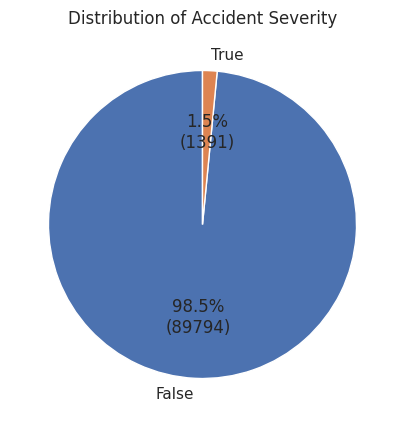

In [170]:
# Count occurrences of each unique value
value_counts = full_raw_m1['accident_severity'].value_counts()

# Plot pie chart
plt.figure(figsize=(5, 5))

# Custom autopct to include both percentage and count
def func(pct, allvals):
    absolute = int(pct/100.*np.sum(allvals))
    return "{:.1f}%\n({:d})".format(pct, absolute)

plt.pie(value_counts, labels=value_counts.index, autopct=lambda pct: func(pct, value_counts), startangle=90)
plt.title('Distribution of Accident Severity')
plt.show()

#Classification Model One: With Raw Data (with -1) and Performing Random Under Sampler Using and Applying Cross Validation:
#Building Molding by Stacking difference classificers
## Decision Tree Classifier
## RandomForestClassifier
## GaussianNB
## KNeighborsClassifier

In [171]:
# Preprocessing the dataset by creating X and Y variables
X =full_raw_m1.drop("accident_severity", axis=1)
y= full_raw_m1["accident_severity"]
# Performing ramdom under smapling


y.value_counts(normalize =True)
X_balanced, y_balanced = RandomUnderSampler().fit_resample(X, y)

# Checking the values of the balanced y_target variable
print(y_balanced.value_counts())

X_train, X_test, y_train, y_test = train_test_split(X_balanced, y_balanced, test_size=0.2, random_state = 0)

False    1391
True     1391
Name: accident_severity, dtype: int64


Stacking the Models

In [172]:
# Stacking model
def evaluate_stacking(X, y):
    def get_stacking():
            level0 = []
            level0.append(("dtree", DecisionTreeClassifier()))
            level0.append(("knn", KNeighborsClassifier()))
            level0.append(("bayes", GaussianNB()))
            level0.append(("rfc", RandomForestClassifier()))
            level1 = LogisticRegression()

            model = StackingClassifier(estimators = level0, final_estimator = level1, cv=5)
            return model

    def evaluate_model(model, X, y):
            cv=RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=24)
            scores = cross_val_score(model, X,y, scoring='accuracy', cv=cv, error_score='raise')
            return scores
    def get_models():
            models=dict()
            models['dtree']= DecisionTreeClassifier()
            models['knn']= KNeighborsClassifier()
            models['bayes']= GaussianNB()
            models["rfc"] = RandomForestClassifier()
            models["stacking"] = get_stacking()
            return models
    models=get_models()
    models



    names=[]
    results=[]
    for name, model in models.items():
            scores= evaluate_model(model, X_train, y_train)
            names.append(name)
            print(f"{name}:{mean(scores):3.2f}, {std(scores):4.3f}")


In [173]:
# apply the model
evaluation_results = evaluate_stacking(X_train, y_train)
print(evaluation_results)

dtree:0.66, 0.030
knn:0.61, 0.031
bayes:0.55, 0.012
rfc:0.77, 0.027
stacking:0.76, 0.025
None


## From the Result Using Random Forest As the Base Mode
## Applying Function to Printig:
## Evaluation Metrics
## Confussion Matrix

In [174]:

def train_and_evaluate_DT(X_train, X_test, y_train, y_test, plot_title):



    # Initialize the DecisionTree Classifier
    rfc = RandomForestClassifier()

    # Training using the DecisionTree Classifier
    rfc.fit(X_train, y_train)

    # Making predictions using the DecisionTree Classifier
    rfc_pred = rfc.predict(X_test)

    # Calculate accuracy of the  classification
    accuracy = accuracy_score(y_test, rfc_pred)
    print(F"Accuracy is {accuracy}")

    # Calculate balanced accuracy of the classification
    balanced_accuracy = balanced_accuracy_score(y_test, rfc_pred)
    print(F"Balanced_accuracy is {balanced_accuracy}")

    # Print classification report
    print('Classification Report:')
    print(classification_report(y_test, rfc_pred))

    # Print confusion matrix
    print('Confusion Matrix:')
    cm = confusion_matrix(y_test, rfc_pred)


   # Plot confusion matrix as heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="viridis", linewidths=0.5)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title("Confusion Matrix - " + plot_title)  # Add the title to the plot title
    plt.savefig(f"{plot_title.replace(' ', '_')}_Confusion_Matrix.png")
    plt.show()



Accuracy is 0.7719928186714542
Balanced_accuracy is 0.7743344533471181
Classification Report:
              precision    recall  f1-score   support

       False       0.82      0.73      0.77       292
        True       0.73      0.82      0.77       265

    accuracy                           0.77       557
   macro avg       0.78      0.77      0.77       557
weighted avg       0.78      0.77      0.77       557

Confusion Matrix:


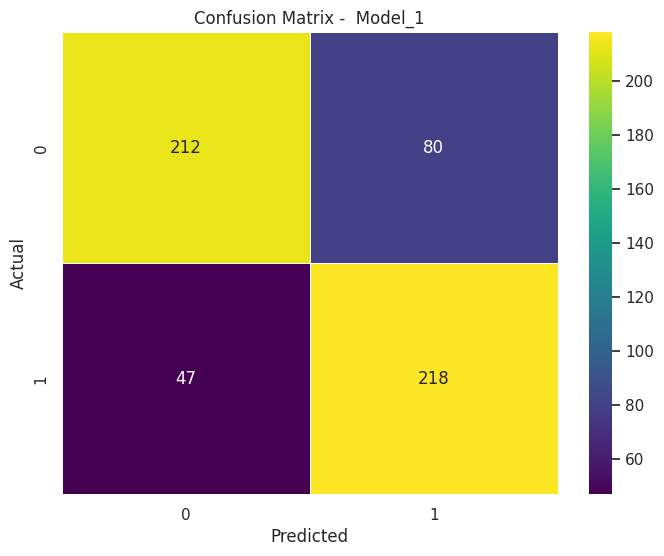

In [175]:
train_and_evaluate_DT(X_train, X_test, y_train, y_test, " Model_1")

# Classification Model Two: With Feature Selection and Performing K Best, Using:
#Building Molding by Stacking difference classificers
## Decision Tree Classifier
## RandomForestClassifier
## GaussianNB
## KNeighborsClassifier

## Feature Selection

In [176]:
X_balanced = X_balanced.loc[:, X_balanced.var() > 1e-10]
X_balanced

,location_easting_osgr,location_northing_osgr,longitude,latitude,number_of_vehicles,number_of_casualties,day_of_week,local_authority_district,first_road_class,first_road_number,...,age_of_casualty,age_band_of_casualty,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
3213,545195.0,186601.0,0.093173,51.559609,1,1,2,14,3,1083,...,64,9,5,1,0,0,0,0,1,4
199044,376775.0,206620.0,-2.337885,51.757785,2,1,2,624,3,38,...,23,5,0,0,0,0,0,3,1,6
132993,641434.0,311676.0,1.567786,52.649064,3,4,7,402,3,1064,...,28,6,0,0,0,0,0,9,2,10
63333,391324.0,406719.0,-2.132436,53.557037,2,1,2,104,3,663,...,28,6,0,0,0,0,0,4,1,8
3307,534092.0,183022.0,-0.068256,51.530194,2,1,3,5,6,0,...,23,5,0,0,0,0,0,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219880,254367.0,661245.0,-4.326142,55.822415,1,1,2,926,4,762,...,46,8,6,9,0,0,0,0,1,2
220063,270790.0,659812.0,-4.063523,55.814225,2,1,2,938,1,74,...,24,5,8,3,0,0,0,0,-1,-1
220140,113410.0,903322.0,-6.842655,57.926736,1,1,5,941,3,859,...,29,6,0,0,0,0,0,19,3,5
220162,381609.0,654146.0,-2.294786,55.780278,2,1,6,914,3,6105,...,30,6,0,0,0,0,0,1,2,4


([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14],
 [Text(0, 0, 'local_authority_district'),
  Text(1, 0, 'speed_limit'),
  Text(2, 0, 'junction_control'),
  Text(3, 0, 'second_road_class'),
  Text(4, 0, 'light_conditions'),
  Text(5, 0, 'urban_or_rural_area'),
  Text(6, 0, 'vehicle_location_restricted_lane'),
  Text(7, 0, 'junction_location'),
  Text(8, 0, 'hit_object_in_carriageway'),
  Text(9, 0, 'hit_object_off_carriageway'),
  Text(10, 0, 'sex_of_driver'),
  Text(11, 0, 'age_band_of_driver'),
  Text(12, 0, 'vehicle_reference_y'),
  Text(13, 0, 'age_of_casualty'),
  Text(14, 0, 'age_band_of_casualty')])

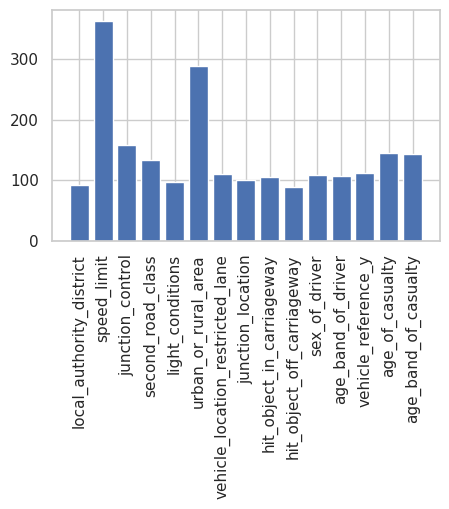

In [177]:
selector = SelectKBest(f_classif, k=15)
selector.fit(X_balanced, y_balanced)

# Defining the parameter of the selected variables and storing their names
mask = selector.get_support()
feature =selector.feature_names_in_[mask]
scores = selector.scores_[mask]


# Plotting the selected variables
plt.bar(feature, scores)
plt.xticks(rotation ='vertical')

In [178]:
feature

array(['local_authority_district', 'speed_limit', 'junction_control',
       'second_road_class', 'light_conditions', 'urban_or_rural_area',
       'vehicle_location_restricted_lane', 'junction_location',
       'hit_object_in_carriageway', 'hit_object_off_carriageway',
       'sex_of_driver', 'age_band_of_driver', 'vehicle_reference_y',
       'age_of_casualty', 'age_band_of_casualty'], dtype=object)

## Using Best 15 Features

## Using the extraced features( columns to train the model)

In [179]:
X_balanced_ft = X_balanced[feature]
#  Splitting the n
X_train1, X_test1, y_train1, y_test1 = train_test_split(X_balanced_ft, y_balanced, test_size=0.2, random_state = 0)

Accuracy is 0.725314183123878
Balanced_accuracy is 0.7264990953734816
Classification Report:
              precision    recall  f1-score   support

       False       0.76      0.70      0.73       292
        True       0.70      0.75      0.72       265

    accuracy                           0.73       557
   macro avg       0.73      0.73      0.73       557
weighted avg       0.73      0.73      0.73       557

Confusion Matrix:


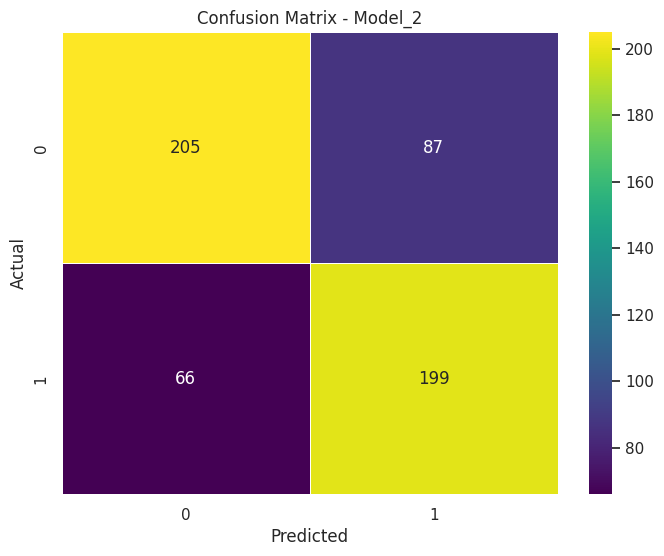

In [180]:
# Applying the Model function to validation the second model
train_and_evaluate_DT(X_train1, X_test1, y_train1, y_test1, "Model_2")

# Using the Clean Data (full_clean_m3) From The initial Secondary Cleaning to Duild Model_3

## The Severity in the Clean data to True or False (fatal or Non Fata)

In [181]:
def convert_to_bool(column):
    return [True if val == 1 else False for val in column]


# applying the function to the accident_severity column
full_clean_m3["accident_severity"] = convert_to_bool(full_clean_m3["accident_severity"])

# Checking the unique values in the accident_severity class now
full_clean_m3["accident_severity"].unique()

array([False,  True])

## Drop the irrelevant feature(columns)

In [182]:
full_clean_m3 = full_clean_m3.drop(["accident_year", "police_force","casualty_severity","vehicle_index", "casualty_index", "casualty_reference", "did_police_officer_attend_scene_of_accident"], axis='columns')

In [183]:
# Preprocessing the dataset by creating X and Y variables
X = full_clean_m3.drop("accident_severity", axis=1)
y= full_clean_m3["accident_severity"]
# Performing SMOTE analysis


y.value_counts(normalize =True)
X_balanced_3, y_balanced_3 = RandomUnderSampler().fit_resample(X, y)

# Checking the values of the balanced y_target variable
y_balanced_3.value_counts()

False    1391
True     1391
Name: accident_severity, dtype: int64

Accuracy is 0.7360861759425493
Balanced_accuracy is 0.7374709227190488
Classification Report:
              precision    recall  f1-score   support

       False       0.77      0.71      0.74       292
        True       0.70      0.77      0.73       265

    accuracy                           0.74       557
   macro avg       0.74      0.74      0.74       557
weighted avg       0.74      0.74      0.74       557

Confusion Matrix:


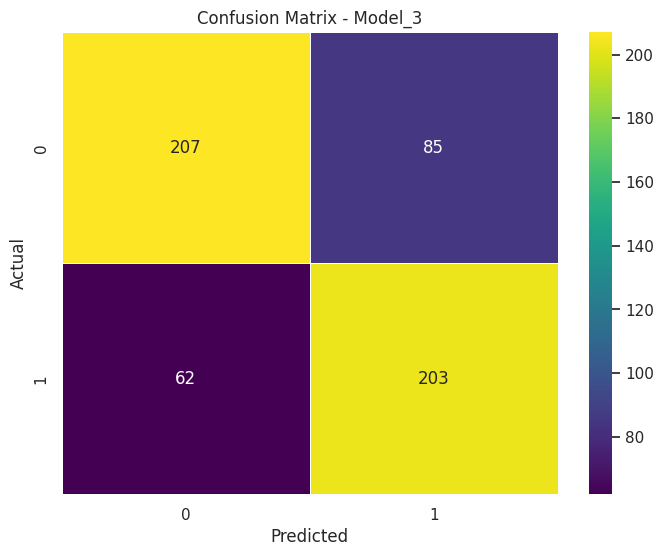

In [184]:
# Splitting the new dataframe into the train and test split
X_train2, X_test2, y_train2, y_test2 = train_test_split(X_balanced_3, y_balanced_3, test_size=0.2, random_state = 0)

# Passing the variables through "the train_and_evaluate_DT" function
train_and_evaluate_DT(X_train2, X_test2, y_train2, y_test2, "Model_3")

In [185]:
###################################################################################################